# Intra-party sub-community analysis

This notebook zooms **inside each major party** and looks for factions/sub-communities using
**Louvain**. The full-parliament graph (`graphs.ipynb`) is dominated by the party signal:
within-party edge weights live in a narrow 0.94-1.00 band, while cross-party weights are much
lower. Naïve community detection on the joint graph just recovers the parties.

So we:

1. Rebuild the MP-MP voting-agreement graph (same formula as `graphs.ipynb`).
2. Extract per-party induced subgraphs for the six major clubs.
3. **Rescale** the narrow internal weight band so Louvain modularity sees contrast.
4. Run Louvain (with a resolution sweep).
5. Visualise per party — sub-communities, strongest connections, weakest connections, plus a
   global (party, sub-community) overlay.
6. **Validate against documented PiS factions** (*harcerze* vs *maślarze*).
7. **Check the PSL-TD left-right axis** by scoring each MP's tilt towards Lewica/Razem vs
   PiS/Konfederacja.

(Girvan-Newman was tried and dropped: party subgraphs are near-complete (density ≈ 1.0), so even
with sampled edge-betweenness and aggressive sparsification the partitions were uninformative.
Louvain on rescaled weights gave clean, interpretable factions.)

## 1. Setup & graph reconstruction

In [1]:
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
from networkx.algorithms import community as nx_community

from utils.config import CLUBS_ORDERED, DEFAULT_CLUB_COLORS, OUT_DIR
import utils.graph.layout
importlib.reload(utils.graph.layout)
from utils.graph.layout import plot_graph_by_club

SRC_ROOT = Path('').resolve().parents[1]
PARQUET_OUT_DIR = SRC_ROOT / OUT_DIR

RNG_SEED = 42



In [2]:
df_members = pd.read_parquet(PARQUET_OUT_DIR / 'members.parquet')
df_votes = pd.read_parquet(PARQUET_OUT_DIR / 'votes.parquet')
df_votings = pd.read_parquet(PARQUET_OUT_DIR / 'votings_processed.parquet')

votes_with_weights = df_votes[["sitting", "votingNumber", "MP", "vote"]].merge(
    df_votings[["sitting", "votingNumber", "vote_weight"]],
    on=["sitting", "votingNumber"],
    how="inner",
)

pairs = votes_with_weights.merge(
    votes_with_weights,
    on=["sitting", "votingNumber"],
    suffixes=("_i", "_j"),
)
pairs = pairs[pairs["MP_i"] < pairs["MP_j"]].copy()
pairs["denom_w"] = pairs["vote_weight_i"]
pairs["score_w"] = pairs["denom_w"] * pairs["vote_i"].eq(pairs["vote_j"]).astype(float)

edge_stats = pairs.groupby(["MP_i", "MP_j"], as_index=False).agg(
    score=("score_w", "sum"),
    denom=("denom_w", "sum"),
)
edge_stats = edge_stats[edge_stats["denom"] > 0].copy()
edge_stats["weight"] = edge_stats["score"] / edge_stats["denom"]


In [3]:
members_nodes = df_members[["MP", "club"]].drop_duplicates(subset=["MP"]).copy()
mp_to_club = members_nodes.set_index("MP")["club"].to_dict()
mp_to_name = (
    df_members[["MP", "firstName", "lastName"]]
    .drop_duplicates(subset=["MP"])
    .assign(name=lambda d: d["firstName"].fillna("") + " " + d["lastName"].fillna(""))
    .set_index("MP")["name"]
    .to_dict()
)

G = nx.Graph()
for row in members_nodes.itertuples(index=False):
    G.add_node(int(row.MP), club=row.club)

for row in edge_stats.itertuples(index=False):
    G.add_edge(int(row.MP_i), int(row.MP_j), weight=float(row.weight))

if 166 in G:
    G.remove_node(166)

print({
    "nodes": G.number_of_nodes(),
    "edges": G.number_of_edges(),
    "weight_min": float(edge_stats["weight"].min()),
    "weight_mean": float(edge_stats["weight"].mean()),
    "weight_max": float(edge_stats["weight"].max()),
})


{'nodes': 497, 'edges': 122194, 'weight_min': 0.0, 'weight_mean': 0.49194542602635105, 'weight_max': 1.0}


## 2. Why per-party? Intra vs cross-party edge weights

Within-party edges sit in a tight high-weight band. Cross-party edges are far more spread out. A
Louvain run on the full graph just recovers the parties — the faction signal is buried inside
each party's band.

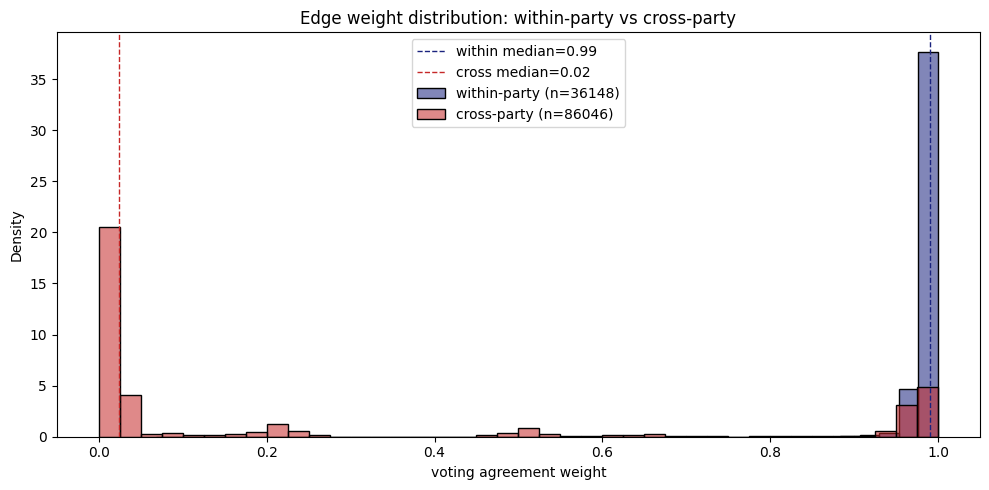

In [4]:
def _is_same_club(u_club, v_club):
    return u_club == v_club

intra_weights = []
cross_weights = []
for u, v, d in G.edges(data=True):
    cu = G.nodes[u].get("club")
    cv = G.nodes[v].get("club")
    if cu is None or cv is None:
        continue
    (intra_weights if cu == cv else cross_weights).append(d["weight"])

fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(intra_weights, bins=40, color="#1A237E", alpha=0.55, label=f"within-party (n={len(intra_weights)})", ax=ax, stat="density")
sns.histplot(cross_weights, bins=40, color="#C62828", alpha=0.55, label=f"cross-party (n={len(cross_weights)})", ax=ax, stat="density")
ax.axvline(np.median(intra_weights), color="#1A237E", ls="--", lw=1, label=f"within median={np.median(intra_weights):.2f}")
ax.axvline(np.median(cross_weights), color="#C62828", ls="--", lw=1, label=f"cross median={np.median(cross_weights):.2f}")
ax.set_title("Edge weight distribution: within-party vs cross-party")
ax.set_xlabel("voting agreement weight")
ax.legend()
plt.tight_layout(); plt.show()


In [5]:
# Full-graph Louvain: expect communities ~ parties
full_communities = nx_community.louvain_communities(G, weight="weight", resolution=1.0, seed=RNG_SEED)
print(f"full-graph Louvain: {len(full_communities)} communities, sizes={sorted((len(c) for c in full_communities), reverse=True)}")

full_partition = {mp: cid for cid, comm in enumerate(full_communities) for mp in comm}
full_df = pd.DataFrame({
    "MP": list(full_partition.keys()),
    "community": list(full_partition.values()),
})
full_df["club"] = full_df["MP"].map(mp_to_club)
crosstab = pd.crosstab(full_df["community"], full_df["club"])
crosstab


full-graph Louvain: 2 communities, sizes=[269, 228]


club,Centrum,Demokracja,KO,Konfederacja,Konfederacja_KP,Lewica,PSL-TD,PiS,Polska2050,Razem,niez.
community,,,,,,,,,,,
0,15,0,174,0,0,23,33,0,15,4,5
1,0,4,0,18,3,0,0,202,0,0,1


The crosstab shows communities line up almost 1-to-1 with clubs. To find **sub-communities
inside a party**, we must switch to per-party subgraphs with rescaled weights.

## 3. Per-party subgraph extraction

In [6]:
def extract_party_subgraph(graph: nx.Graph, club: str) -> nx.Graph:
    nodes = [n for n, d in graph.nodes(data=True) if d.get("club") == club]
    return graph.subgraph(nodes).copy()

party_graphs = {club: extract_party_subgraph(G, club) for club in CLUBS_ORDERED}

rows = []
for club, H in party_graphs.items():
    w = [d["weight"] for _, _, d in H.edges(data=True)]
    rows.append({
        "club": club,
        "n_nodes": H.number_of_nodes(),
        "n_edges": H.number_of_edges(),
        "density": nx.density(H),
        "w_min": float(np.min(w)) if w else np.nan,
        "w_mean": float(np.mean(w)) if w else np.nan,
        "w_median": float(np.median(w)) if w else np.nan,
        "w_max": float(np.max(w)) if w else np.nan,
    })
pd.DataFrame(rows).set_index("club")


,n_nodes,n_edges,density,w_min,w_mean,w_median,w_max
club,,,,,,,
Razem,4,6,1.000000,0.992822,0.994539,0.994723,0.996088
Lewica,23,251,0.992095,0.948456,0.985549,0.990867,1.000000
KO,174,14809,0.983921,0.953005,0.996296,0.997335,1.000000
Polska2050,15,105,1.000000,0.960400,0.986928,0.989720,0.997098
PSL-TD,33,527,0.998106,0.945043,0.984163,0.985613,0.998506
Centrum,15,105,1.000000,0.977811,0.990679,0.991500,0.998196
Konfederacja,18,149,0.973856,0.871521,0.931055,0.930446,0.994680
Konfederacja_KP,3,3,1.000000,0.711710,0.804608,0.721924,0.980192
PiS,202,20172,0.993646,0.730946,0.982202,0.984329,1.000000


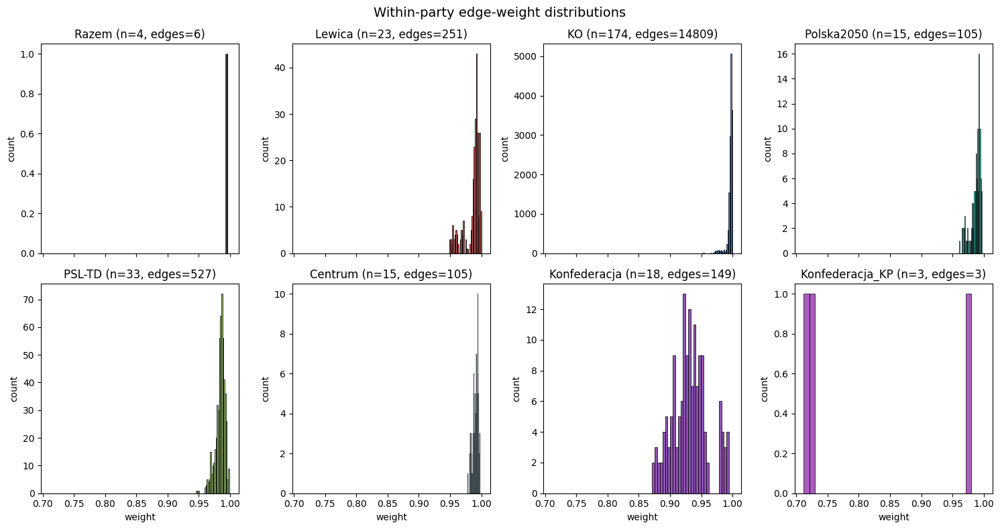

In [7]:
fig, axes = plt.subplots(2, 4, figsize=(15, 8), sharex=True)
for ax, club in zip(axes.flat, CLUBS_ORDERED):
    H = party_graphs[club]
    w = [d["weight"] for _, _, d in H.edges(data=True)]
    color = DEFAULT_CLUB_COLORS.get(club, "#444")
    sns.histplot(w, bins=30, color=color, ax=ax)
    ax.set_title(f"{club} (n={H.number_of_nodes()}, edges={H.number_of_edges()})")
    ax.set_xlabel("weight"); ax.set_ylabel("count")
fig.suptitle("Within-party edge-weight distributions", fontsize=14)
plt.tight_layout(); plt.show()


## 4. Weight rescaling for internal resolution

Two derived edge attributes per party subgraph:

- `weight_rescaled`: per-party min-max of `weight` → stretches the 0.94-1.00 band onto [0, 1] so
  Louvain modularity sees contrast.
- `distance`: `1 - weight` — the disagreement distance used as the Girvan-Newman edge-betweenness
  weight (higher weight ⇒ longer shortest path ⇒ edge is less central).

In [67]:
from scipy.stats import rankdata

def annotate_weights(H: nx.Graph) -> nx.Graph:
    weights = np.array([d["weight"] for _, _, d in H.edges(data=True)])
    if weights.size == 0:
        return H
    
    rescaled = (rankdata(weights) - 1) / (len(weights) - 1)  # [0, 1], mediana = 0.5
    
    for (u, v, d), w_r in zip(H.edges(data=True), rescaled):
        d["weight_rescaled"] = float(w_r)
        d["distance"] = 1.0 - d["weight"]
    return H

for club, H in party_graphs.items():
    annotate_weights(H)

# sanity: peek at one party
_sample = next(iter(party_graphs["PiS"].edges(data=True)))
_sample


(1,
 3,
 {'weight': 0.9823982088487245,
  'weight_rescaled': 0.40161618164691887,
  'distance': 0.01760179115127547})

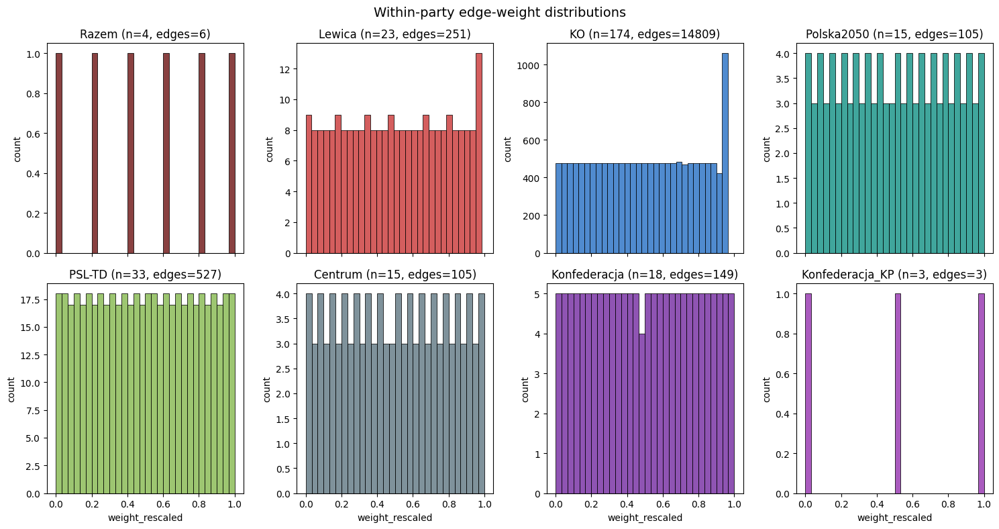

In [68]:
fig, axes = plt.subplots(2, 4, figsize=(15, 8), sharex=True)
for ax, club in zip(axes.flat, CLUBS_ORDERED):
    H = party_graphs[club]
    w = [d["weight_rescaled"] for _, _, d in H.edges(data=True)]
    color = DEFAULT_CLUB_COLORS.get(club, "#444")
    sns.histplot(w, bins=30, color=color, ax=ax)
    ax.set_title(f"{club} (n={H.number_of_nodes()}, edges={H.number_of_edges()})")
    ax.set_xlabel("weight_rescaled"); ax.set_ylabel("count")
fig.suptitle("Within-party edge-weight distributions", fontsize=14)
plt.tight_layout(); plt.show()

## 5. Louvain per party

We sweep the resolution γ ∈ {0.5, 1.0, 1.5, 2.0, 3.0}. Higher γ → more, smaller communities.
For each party we run Louvain on both **raw** weights (expected: one giant blob) and **rescaled**
weights (expected: interpretable factions).

In [69]:
GAMMA_SWEEP = [0.5, 1.0, 1.5, 2.0, 3.0]

def louvain_with_modularity(H, weight_attr, resolution):
    comms = nx_community.louvain_communities(H, weight=weight_attr, resolution=resolution, seed=RNG_SEED)
    mod = nx_community.modularity(H, comms, weight=weight_attr, resolution=resolution)
    return comms, mod

sweep_rows = []
for club, H in party_graphs.items():
    for gamma in GAMMA_SWEEP:
        for attr in ("weight", "weight_rescaled"):
            comms, mod = louvain_with_modularity(H, attr, gamma)
            sweep_rows.append({
                "club": club,
                "gamma": gamma,
                "weight_attr": attr,
                "n_communities": len(comms),
                "modularity": mod,
                "sizes": sorted((len(c) for c in comms), reverse=True),
            })
sweep_df = pd.DataFrame(sweep_rows)
sweep_df


,club,gamma,weight_attr,n_communities,modularity,sizes
0,Razem,0.5,weight,1,0.500000,[4]
1,Razem,0.5,weight_rescaled,1,0.500000,[4]
2,Razem,1.0,weight,1,0.000000,[4]
3,Razem,1.0,weight_rescaled,1,0.000000,[4]
4,Razem,1.5,weight,4,-0.375000,"[1, 1, 1, 1]"
...,...,...,...,...,...,...
85,PiS,1.5,weight_rescaled,112,-0.003943,"[15, 14, 12, 11, 6, 5, 4, 3, 3, 3, 2, 2, 2, 2,..."
86,PiS,2.0,weight,202,-0.009905,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
87,PiS,2.0,weight_rescaled,150,-0.008918,"[13, 9, 6, 5, 4, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2,..."
88,PiS,3.0,weight,202,-0.014858,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."


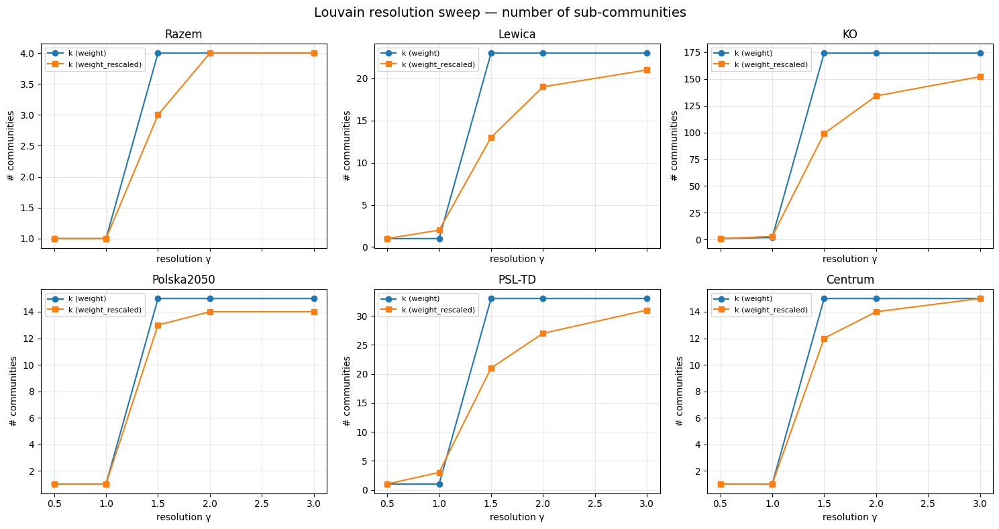

In [70]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8), sharex=True)
for ax, club in zip(axes.flat, CLUBS_ORDERED):
    sub = sweep_df[sweep_df["club"] == club]
    for attr, marker in [("weight", "o"), ("weight_rescaled", "s")]:
        s = sub[sub["weight_attr"] == attr]
        ax.plot(s["gamma"], s["n_communities"], marker=marker, label=f"k ({attr})")
    ax.set_title(club)
    ax.set_xlabel("resolution γ"); ax.set_ylabel("# communities")
    ax.grid(True, alpha=0.3); ax.legend(fontsize=8)
fig.suptitle("Louvain resolution sweep — number of sub-communities", fontsize=14)
plt.tight_layout(); plt.show()


In [71]:
# Pick a per-party resolution gamma. Strategy:
#   1. Try gamma = 1.0 (Louvain default).
#   2. If we get only one community, escalate gamma until a split appears.
#   3. Reject any partition with modularity <= 0 — Louvain finding "k=14 singletons,
#      mod=-0.1" means there genuinely is no faction structure, not that we should
#      split harder. In that case we report the party as a single cohesive community.
CHOSEN_GAMMA = 1.0
ESCALATION_GAMMAS = (1.5, 2.0, 3.0, 5.0)
MIN_MODULARITY = 0.0   # strict >; mod==0 is the trivial all-in-one partition


party_louvain = {}
for club, H in party_graphs.items():
    accepted = None
    for g in (CHOSEN_GAMMA, *ESCALATION_GAMMAS):
        comms, mod = louvain_with_modularity(H, "weight_rescaled", g)
        if len(comms) >= 2 and mod > MIN_MODULARITY:
            accepted = (g, comms, mod)
            break

    if accepted is None:
        # No gamma produced a partition with positive modularity — keep the party whole.
        used_gamma = CHOSEN_GAMMA
        comms = [set(H.nodes())]
        mod = 0.0
    else:
        used_gamma, comms, mod = accepted

    partition = {mp: cid for cid, comm in enumerate(comms) for mp in comm}
    party_louvain[club] = {
        "communities": comms,
        "modularity": mod,
        "partition": partition,
        "gamma": used_gamma,
    }

for club, info in party_louvain.items():
    sizes = sorted((len(c) for c in info["communities"]), reverse=True)
    note = "  (no internal structure)" if len(sizes) == 1 else ""
    print(
        f"{club}: gamma={info['gamma']} k={len(info['communities'])} "
        f"sizes={sizes} mod={info['modularity']:.3f}{note}"
    )


Razem: gamma=1.0 k=1 sizes=[4] mod=0.000  (no internal structure)
Lewica: gamma=1.0 k=2 sizes=[14, 9] mod=0.053
KO: gamma=1.0 k=3 sizes=[93, 58, 23] mod=0.053
Polska2050: gamma=1.0 k=1 sizes=[15] mod=0.000  (no internal structure)
PSL-TD: gamma=1.0 k=3 sizes=[12, 11, 10] mod=0.027
Centrum: gamma=1.0 k=1 sizes=[15] mod=0.000  (no internal structure)
Konfederacja: gamma=1.0 k=2 sizes=[9, 9] mod=0.090
Konfederacja_KP: gamma=1.0 k=1 sizes=[3] mod=0.000  (no internal structure)
PiS: gamma=1.0 k=3 sizes=[97, 83, 22] mod=0.039


In [72]:
# Member rosters per sub-community, sorted by community size
def roster_table(club):
    info = party_louvain[club]
    comms = sorted(info["communities"], key=len, reverse=True)
    rows = []
    for cid, comm in enumerate(comms):
        H = party_graphs[club]
        internal = []
        for mp in comm:
            neighbours = [n for n in H.neighbors(mp) if n in comm]
            if neighbours:
                internal.append(np.mean([H[mp][n]["weight"] for n in neighbours]))
        rows.append({
            "community": cid,
            "size": len(comm),
            #"mean_internal_w": float(np.mean(internal)) if internal else np.nan,
            "members": ", ".join(sorted(mp_to_name.get(m, str(m)) for m in comm)),
        })
    return pd.DataFrame(rows)

for club in CLUBS_ORDERED:#
    print(f"\n=== {club} ===")
    display(roster_table(club))



=== Razem ===


,community,size,members
0,0,4,"Adrian Zandberg, Maciej Konieczny, Marcelina Z..."



=== Lewica ===


,community,size,members
0,0,14,"Andrzej Szejna, Anita Kucharska-Dziedzic, Anna..."
1,1,9,"Agnieszka Dziemianowicz-Bąk, Daria Gosek-Popio..."



=== KO ===


,community,size,members
0,0,93,"Adam Krzemiński, Aleksandra Kot, Aleksandra Uz..."
1,1,58,"Adam Szłapka, Agnieszka Hanajczyk, Aleksander ..."
2,2,23,"Adrian Witczak, Agnieszka Pomaska, Anna Sobola..."



=== Polska2050 ===


,community,size,members
0,0,15,"Adam Gomoła, Adam Luboński, Agnieszka Buczyńsk..."



=== PSL-TD ===


,community,size,members
0,0,12,"Andrzej Grzyb, Henryk Smolarz, Ireneusz Raś, J..."
1,1,11,"Adam Dziedzic, Czesław Siekierski, Dariusz Kli..."
2,2,10,"Agnieszka Kłopotek, Bożena Żelazowska, Jolanta..."



=== Centrum ===


,community,size,members
0,0,15,"Aleksandra Leo, Barbara Okuła, Barbara Oliwiec..."



=== Konfederacja ===


,community,size,members
0,0,9,"Bartłomiej Pejo, Bronisław Foltyn, Grzegorz Pł..."
1,1,9,"Andrzej Zapałowski, Grzegorz Braun, Karina Bos..."



=== Konfederacja_KP ===


,community,size,members
0,0,3,"Roman Fritz, Sławomir Zawiślak, Włodzimierz Sk..."



=== PiS ===


,community,size,members
0,0,97,"Agnieszka Soin, Aleksander Mrówczyński, Andrze..."
1,1,83,"Adam Andruszkiewicz, Agata Wojtyszek, Agnieszk..."
2,2,22,"Agnieszka Ścigaj, Anna Kwiecień, Anna Milczano..."


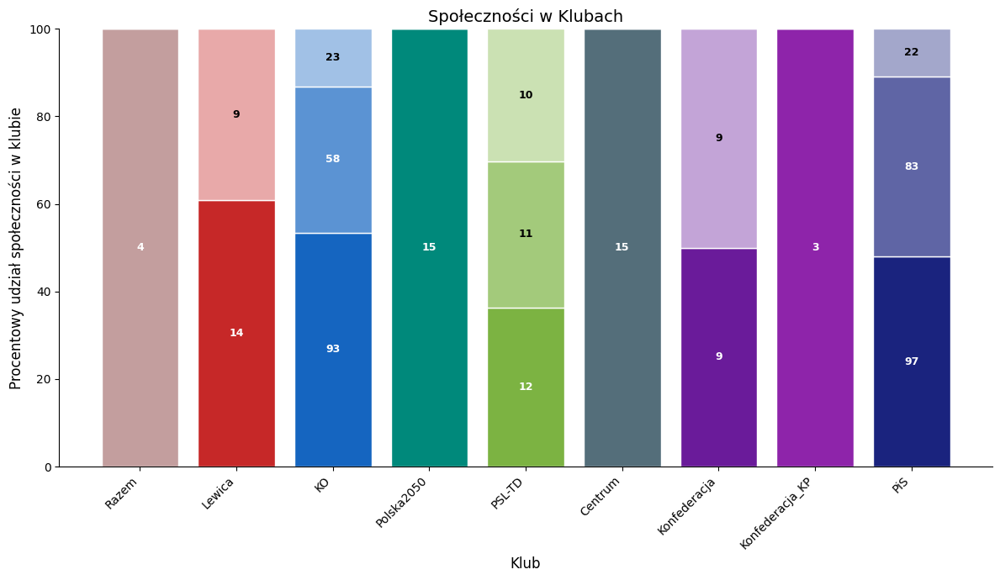

In [73]:
import matplotlib.colors as mcolors

def get_color_variations(base_hex, num_variations):
    """Generates variations of a base color by blending it with white."""
    base_rgba = mcolors.to_rgba(base_hex)
    
    if num_variations <= 1:
        return [base_rgba]
        
    colors = []
    # Linearly decrease the presence of the base color from 100% to 40% 
    for factor in np.linspace(1.0, 0.4, num_variations):
        r = base_rgba[0] * factor + 1.0 * (1 - factor)
        g = base_rgba[1] * factor + 1.0 * (1 - factor)
        b = base_rgba[2] * factor + 1.0 * (1 - factor)
        a = base_rgba[3] # Keep original alpha 
        colors.append((r, g, b, a))
        
    return colors

# 1. Extract parties, their sorted community sizes, and generate their color palettes
parties = list(party_louvain.keys())
sizes_list = []
party_palettes = {}

for club in parties:
    info = party_louvain[club]
    sizes = sorted((len(c) for c in info["communities"]), reverse=True)
    sizes_list.append(sizes)
    
    # Generate variations based on how many communities this specific party has
    base_color = DEFAULT_CLUB_COLORS.get(club, "#333333") # Fallback to dark gray if missing
    party_palettes[club] = get_color_variations(base_color, len(sizes))

# 2. Find the maximum number of communities any single party has 
max_comms = max((len(s) for s in sizes_list), default=0)

fig, ax = plt.subplots(figsize=(12, 7))
bottom = np.zeros(len(parties))

# Precompute totals for normalization
totals = np.array([sum(s) for s in sizes_list], dtype=float)

# 4. Build the stacked bars layer by layer using NORMALIZED sizes
for i in range(max_comms):
    sizes_i = []
    norm_sizes_i = []
    colors_i = []
    
    for j, club in enumerate(parties):
        sizes = sizes_list[j]
        if i < len(sizes):
            raw = sizes[i]
            sizes_i.append(raw)
            norm_sizes_i.append(raw / totals[j] * 100)  # normalize to %
            colors_i.append(party_palettes[club][i])
        else:
            sizes_i.append(0)
            norm_sizes_i.append(0)
            colors_i.append((0, 0, 0, 0))
    
    bars = ax.bar(
        parties, norm_sizes_i,   # <-- plot normalized heights
        bottom=bottom, 
        color=colors_i, 
        edgecolor='white', 
        linewidth=1
    )
    
    # Add text with ORIGINAL absolute numbers
    for bar, size, norm_size, color in zip(bars, sizes_i, norm_sizes_i, colors_i):
        if size > 0:
            r, g, b, _ = color
            luminance = 0.299*r + 0.587*g + 0.114*b
            text_color = 'black' if luminance > 0.65 else 'white'
            
            if norm_size > 1.5:  # skip tiny segments (< 1.5% of bar)
                ax.text(
                    bar.get_x() + bar.get_width() / 2, 
                    bar.get_y() + bar.get_height() / 2,
                    str(size),          # <-- display absolute number
                    ha='center', va='center', color=text_color, 
                    fontsize=9, fontweight='bold'
                )
    
    bottom += np.array(norm_sizes_i)  # <-- accumulate normalized bottoms

ax.set_ylim(0, 100)
ax.set_ylabel('Procentowy udział społeczności w klubie', fontsize=12)
ax.set_xlabel('Klub', fontsize=12)
ax.set_title('Społeczności w Klubach', fontsize=14)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## 6. Visualising the sub-communities

Three views, one figure per party (so each is large enough to read):

- **6.1** Louvain sub-communities laid out by Kamada-Kawai on `distance` (so MPs that disagree
  end up far apart and factions visually separate). Nodes coloured by sub-community, labelled
  with MP id.
- **6.2** The **strongest** internal connections — the loyalist core of each party.
- **6.3** The **weakest** internal connections — the disagreement / fracture lines that divide
  factions.
- **6.4** Global overlay: full graph laid out by club, re-coloured by (party, sub-community).

### 6.1 Sub-communities per party

One figure per major party. Layout: Kamada-Kawai with `distance` (= 1 - weight) as edge length,
so MPs that disagree end up far apart and Louvain factions tend to occupy distinct regions of
the plot. Node colour = sub-community shade; label = MP id (use `mp_to_name` to look up names).

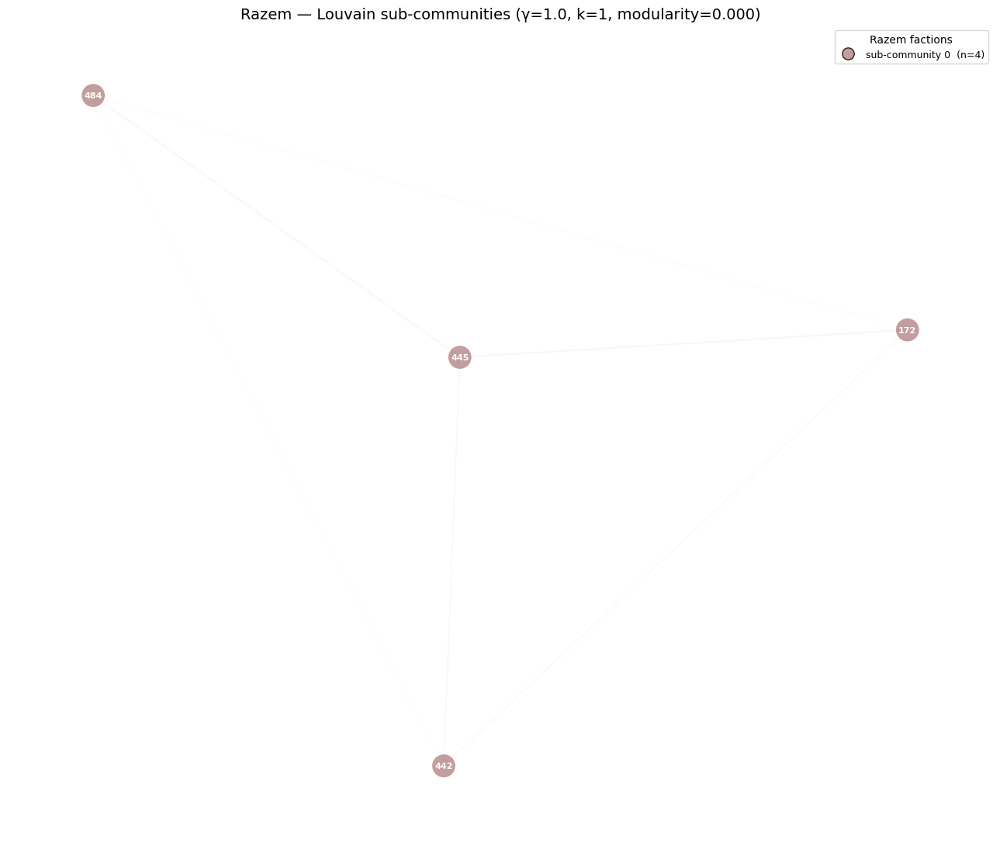

/Users/mikolajmachalski/Studia/1sem/ComplexNetworks/lab5/Repo/.venv/lib/python3.12/site-packages/networkx/drawing/layout.py:987: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)


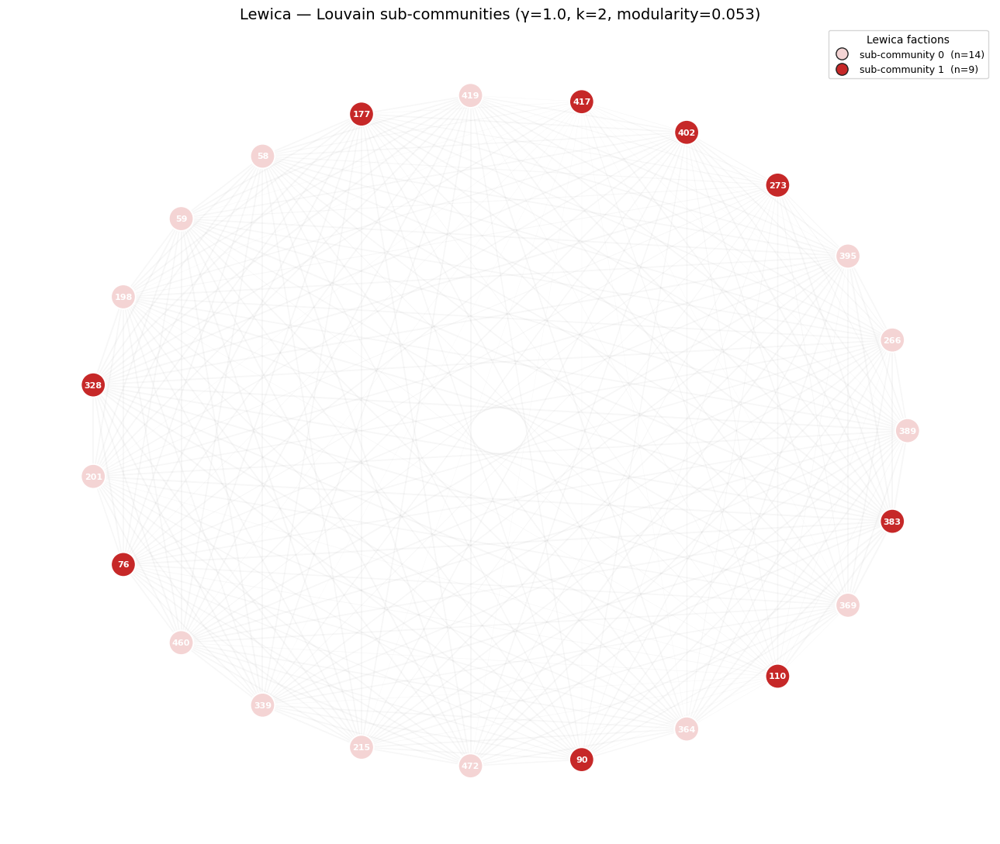

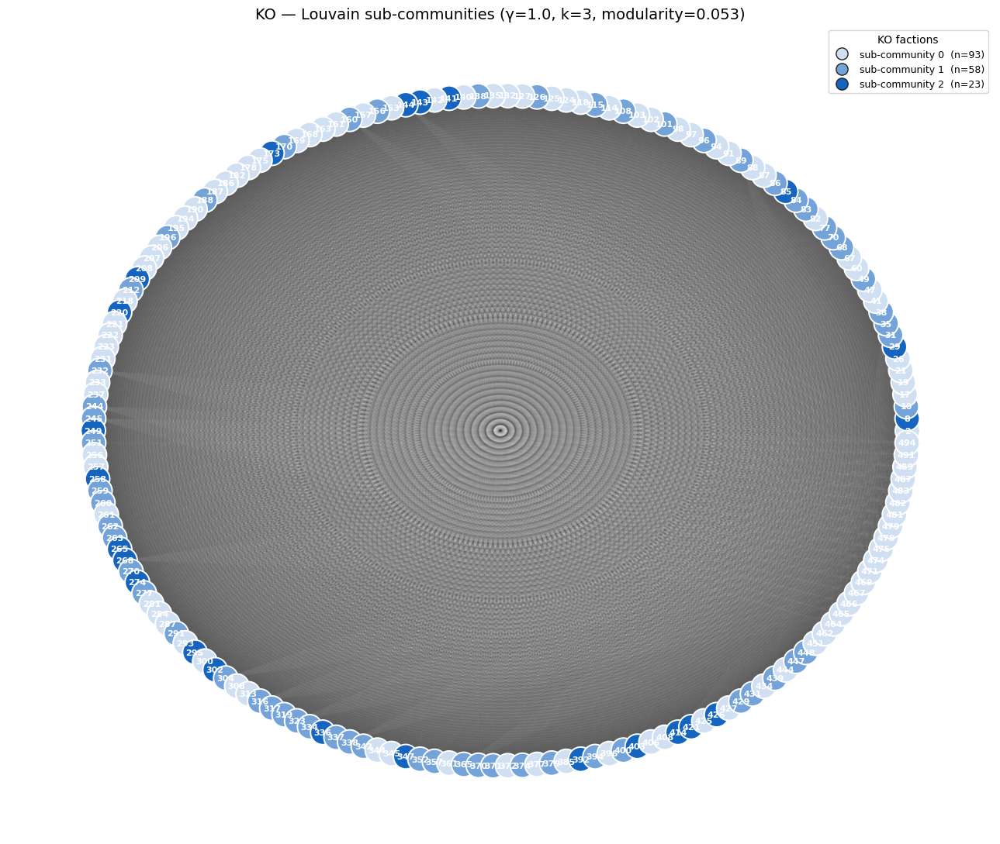

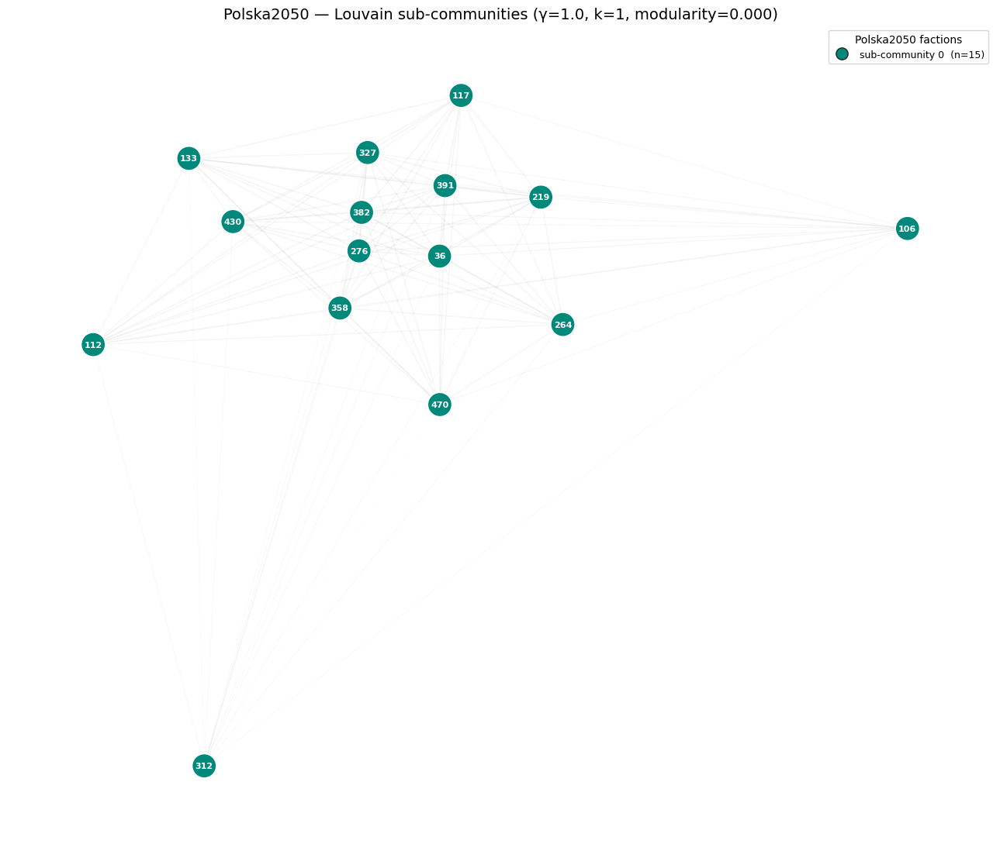

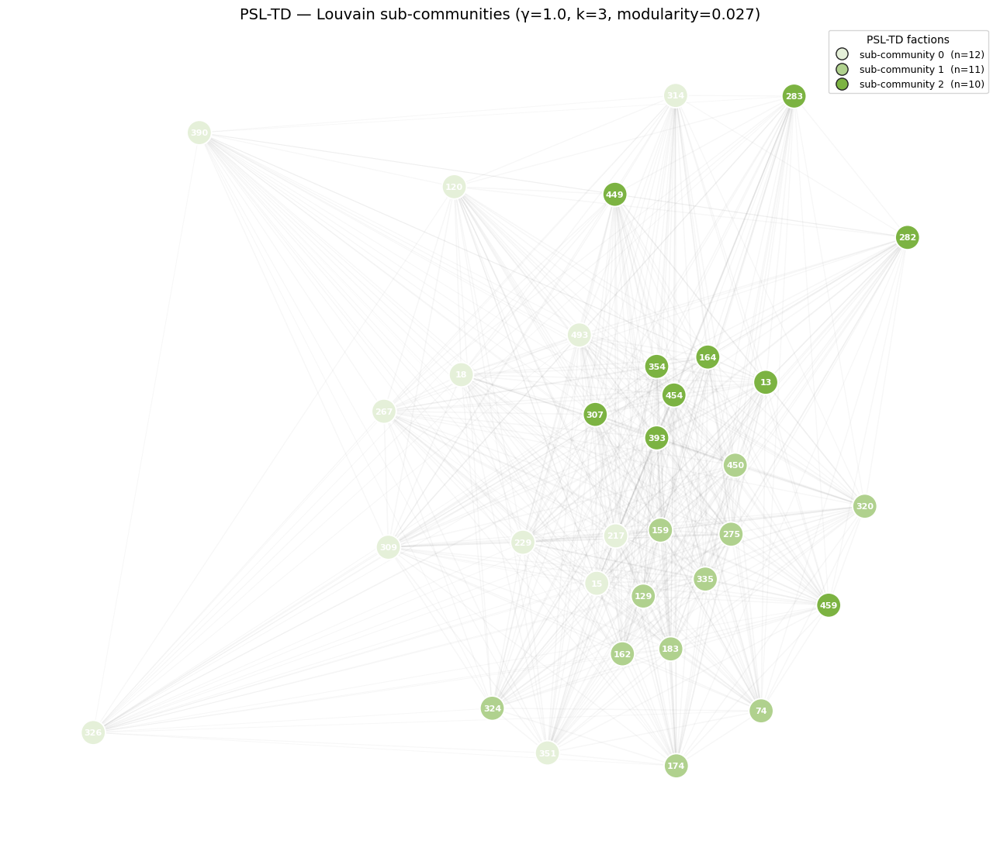

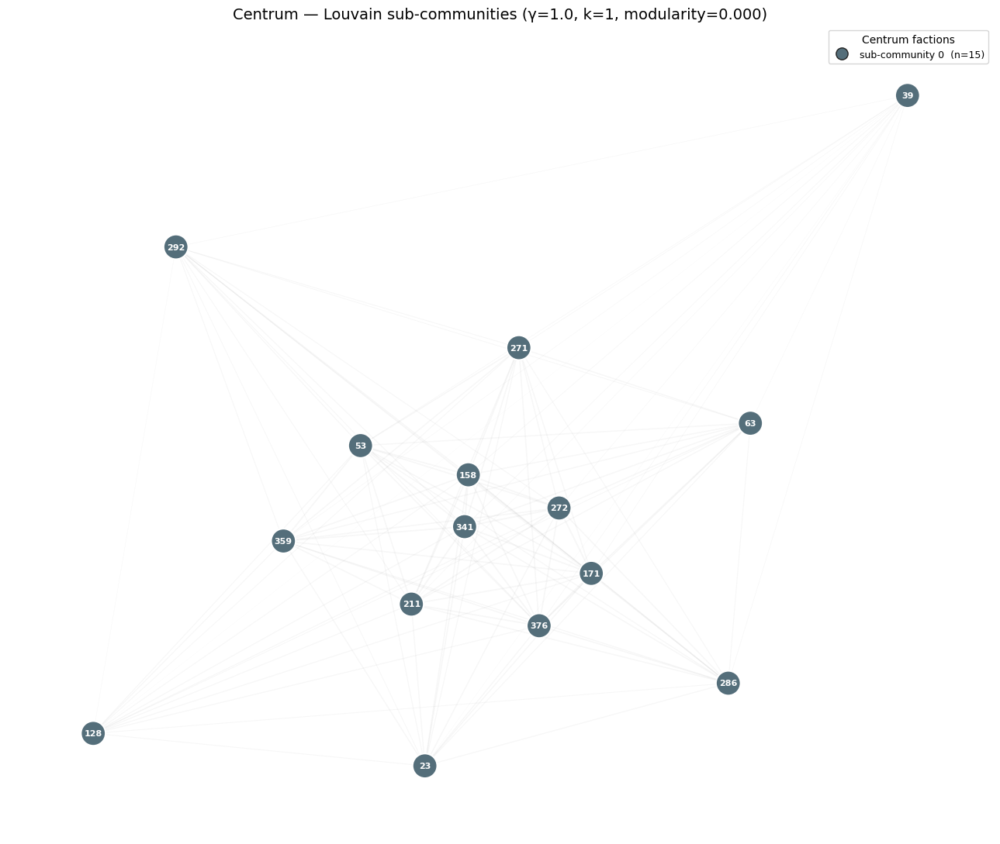

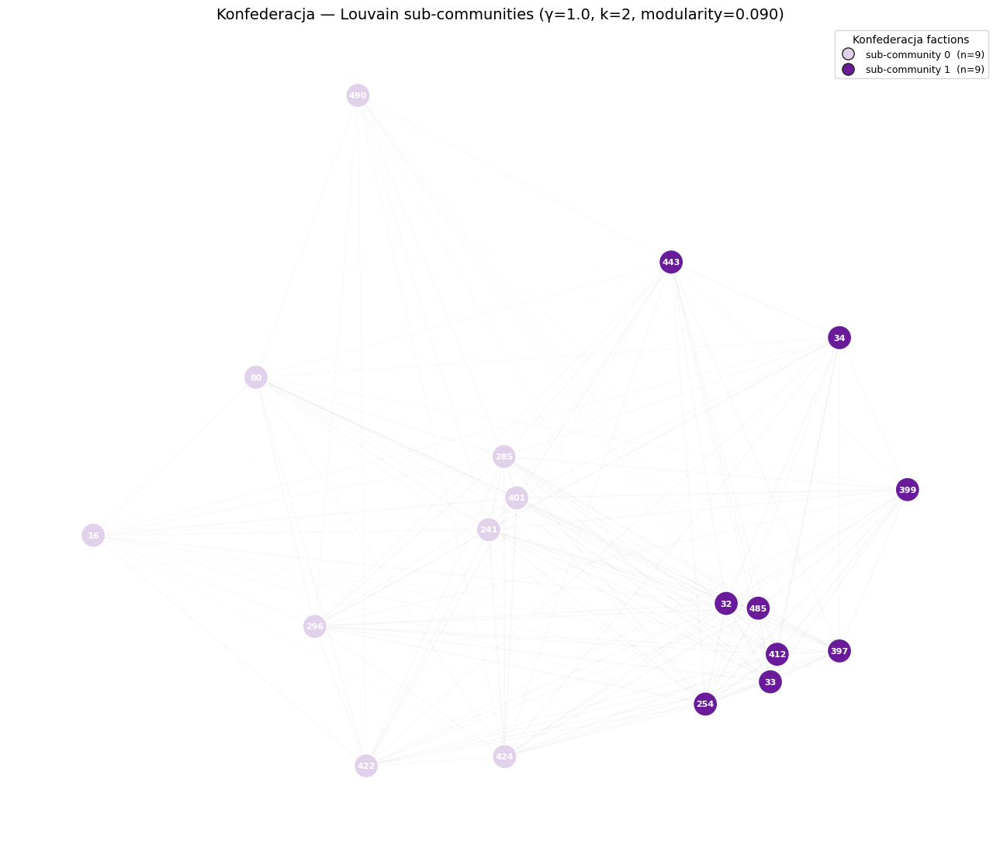

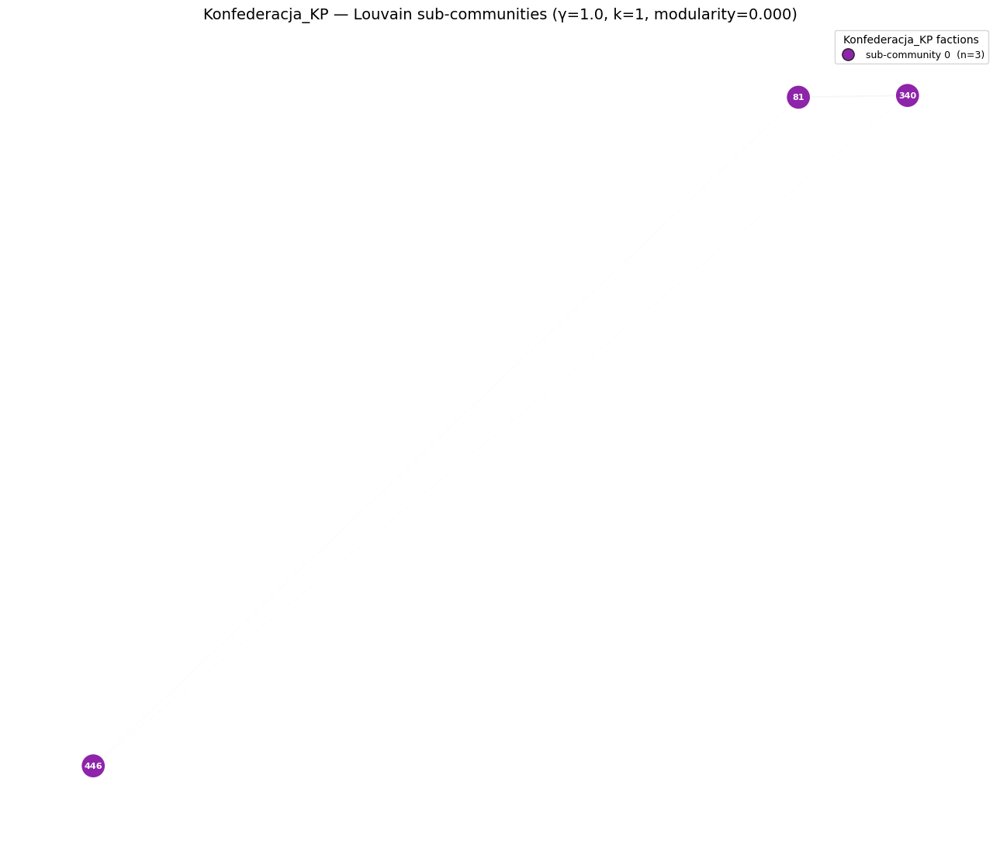

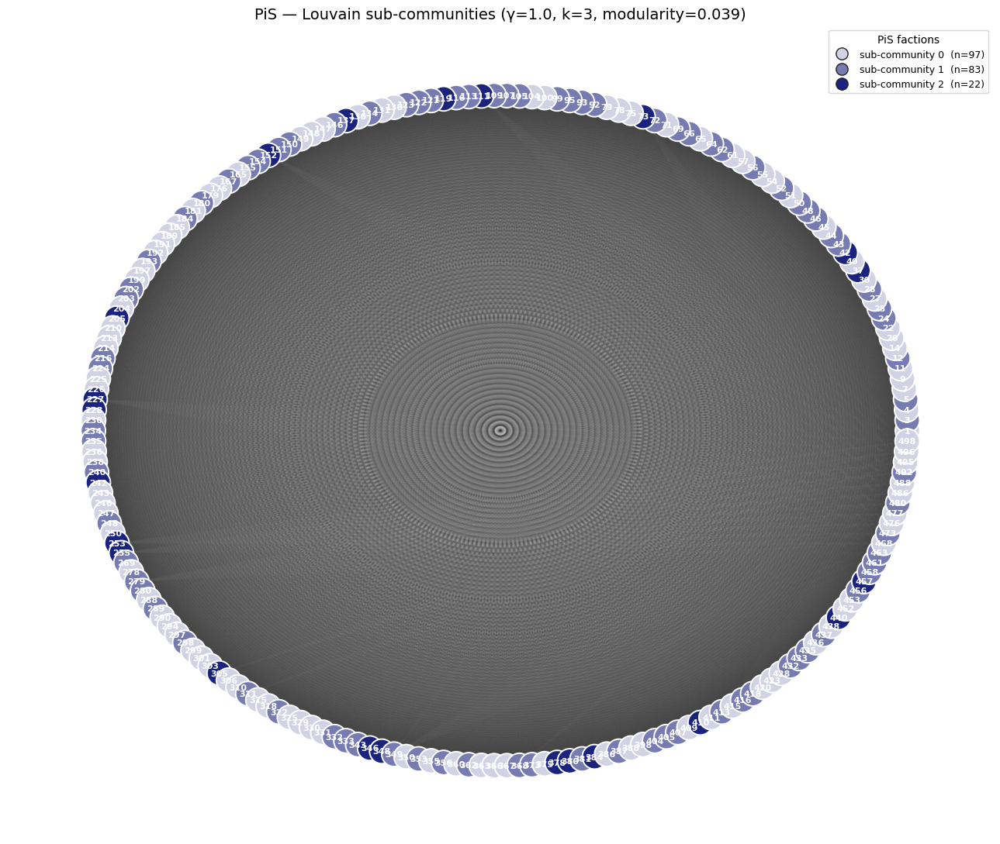

In [93]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D


def _shade_palette(base_hex, n):
    """n colors derived from a base party color via a lightness ramp."""
    base_rgb = np.array(mcolors.to_rgb(base_hex))
    if n <= 1:
        return [base_hex]
    shades = []
    for i in range(n):
        t = 0.20 + 0.8 * (i / max(n - 1, 1))
        shade = (1 - t) * np.ones(3) + t * base_rgb
        shades.append(mcolors.to_hex(shade))
    return shades


def _layout_for_party(H):
    """Kamada-Kawai using `distance` as edge length so disagreement spreads MPs apart.
    Falls back to spring layout if KK fails (e.g. disconnected components)."""
    try:
        return nx.kamada_kawai_layout(H, weight="distance")
    except Exception:
        return nx.spring_layout(H, weight="weight_rescaled", seed=RNG_SEED, k=1.5)


def _community_colors(club):
    """Map each MP in `club` to its sub-community shade."""
    info = party_louvain[club]
    comms = sorted(info["communities"], key=len, reverse=True)
    palette = _shade_palette(DEFAULT_CLUB_COLORS.get(club, "#555555"), len(comms))
    return {mp: palette[cid] for cid, comm in enumerate(comms) for mp in comm}, comms, palette


def _legend_for_communities(comms, palette, title):
    return [
        Line2D([0], [0], marker="o", color="none", markerfacecolor=palette[i],
               markeredgecolor="#222", markersize=11,
               label=f"sub-community {i}  (n={len(comm)})")
        for i, comm in enumerate(comms)
    ], title


def plot_party_subcommunities(club, *, figsize=(13, 11), node_size=520):
    H = party_graphs[club]
    color_of, comms, palette = _community_colors(club)
    pos = _layout_for_party(H)

    fig, ax = plt.subplots(figsize=figsize)

    # Edges: very faint, widths proportional to weight so the cohesive core is hinted
    weights = np.array([d["weight"] for _, _, d in H.edges(data=True)])
    if weights.size:
        span = float(np.ptp(weights)) + 1e-9
        norm = (weights - weights.min()) / span
        widths = 0.2 + 1.2 * norm
        nx.draw_networkx_edges(H, pos, ax=ax, alpha=0.04, width=widths, edge_color="#333333")

    node_colors = [color_of[n] for n in H.nodes()]
    nx.draw_networkx_nodes(H, pos, ax=ax, node_size=node_size, node_color=node_colors,
                           edgecolors="white", linewidths=1.4)
    labels = {n: str(n) for n in H.nodes()}
    nx.draw_networkx_labels(H, pos, labels=labels, ax=ax,
                            font_size=8, font_color="white", font_weight="bold")

    handles, title = _legend_for_communities(comms, palette, club)
    ax.legend(handles=handles, loc="best", title=f"{club} factions", frameon=True, fontsize=9)
    ax.set_title(
        f"{club} — Louvain sub-communities (γ={party_louvain[club]['gamma']}, "
        f"k={len(comms)}, modularity={party_louvain[club]['modularity']:.3f})",
        fontsize=14,
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


for club in CLUBS_ORDERED:
    plot_party_subcommunities(club)

### 6.2 Strongest internal connections per party

The "loyalist core": the highest-weight edges inside each party. Layout is shared with the
sub-community plot above (Kamada-Kawai on `distance`) so the same MP lands at the same place
across the three views — easier to compare. Edge thickness scales with weight; isolated nodes
are drawn faintly.

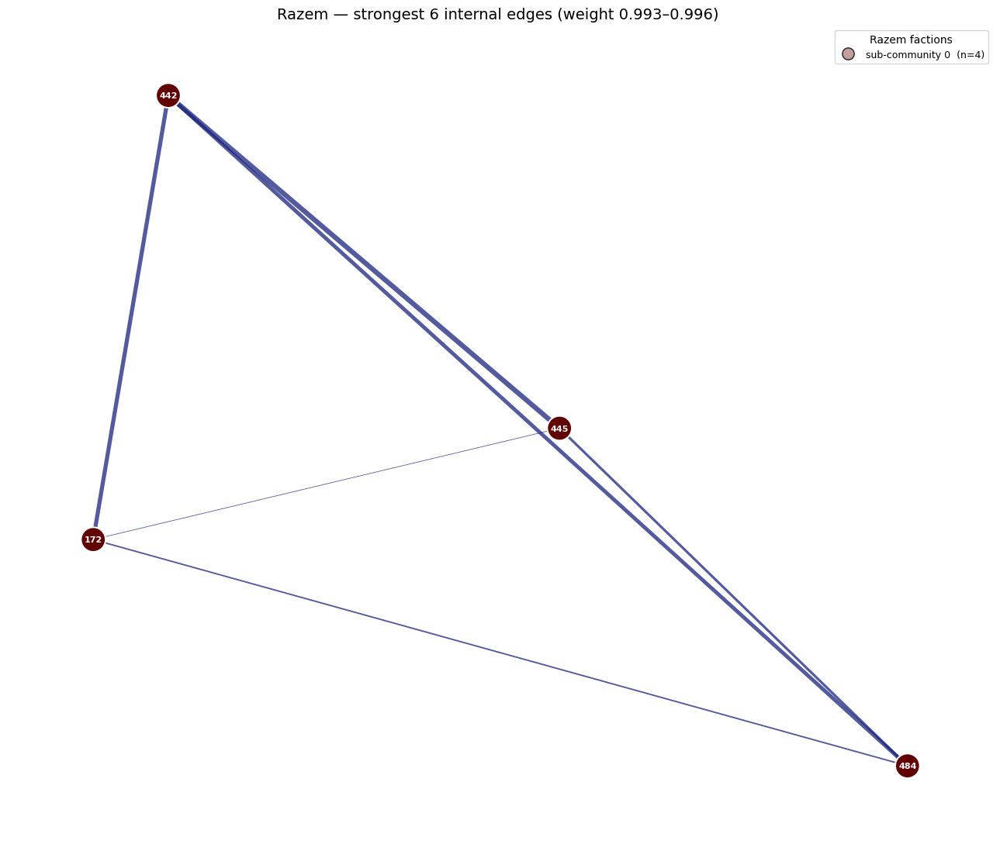

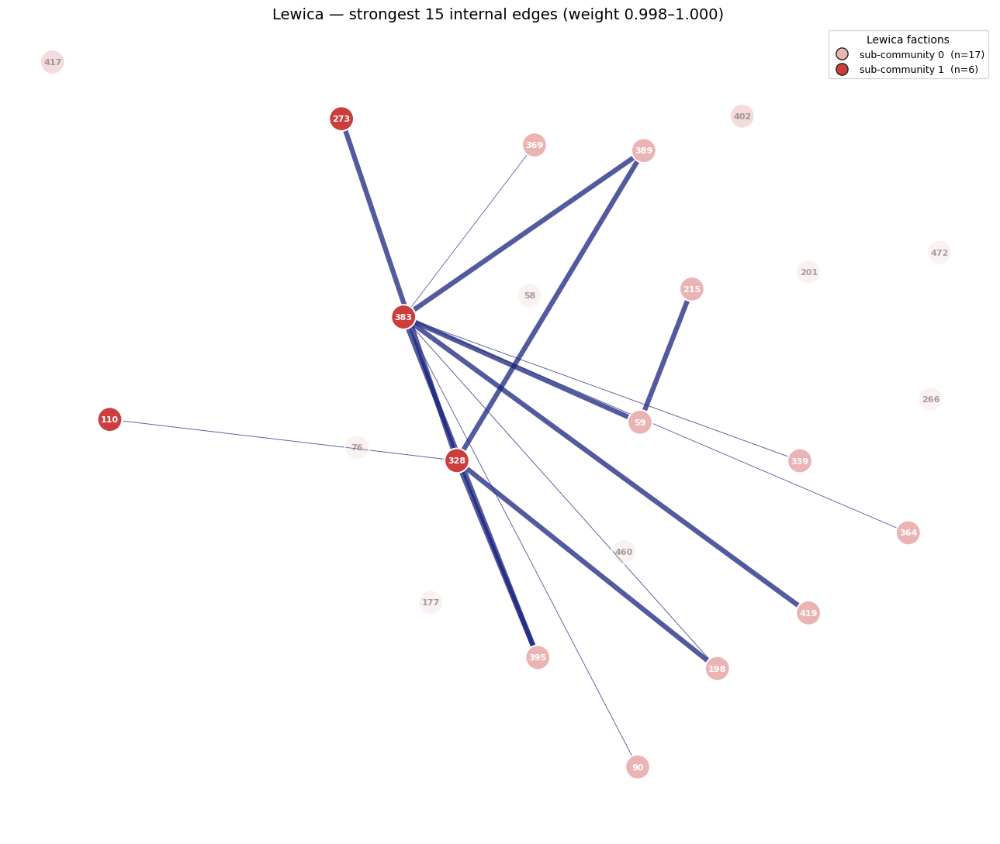

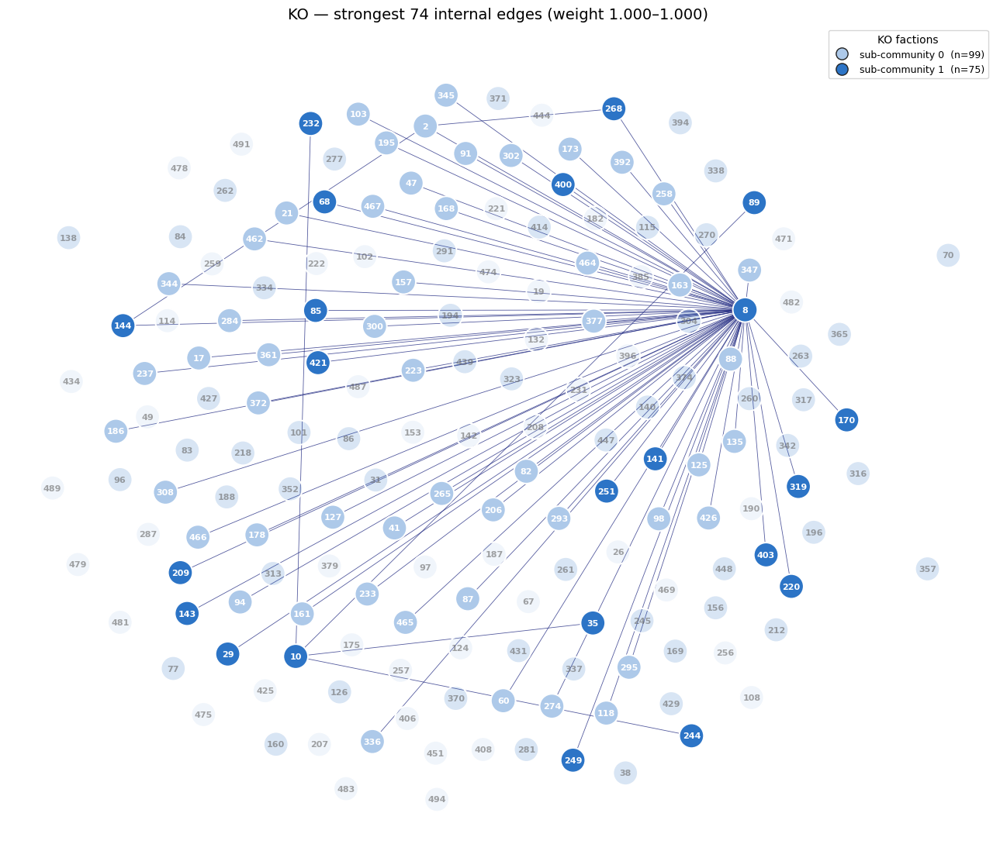

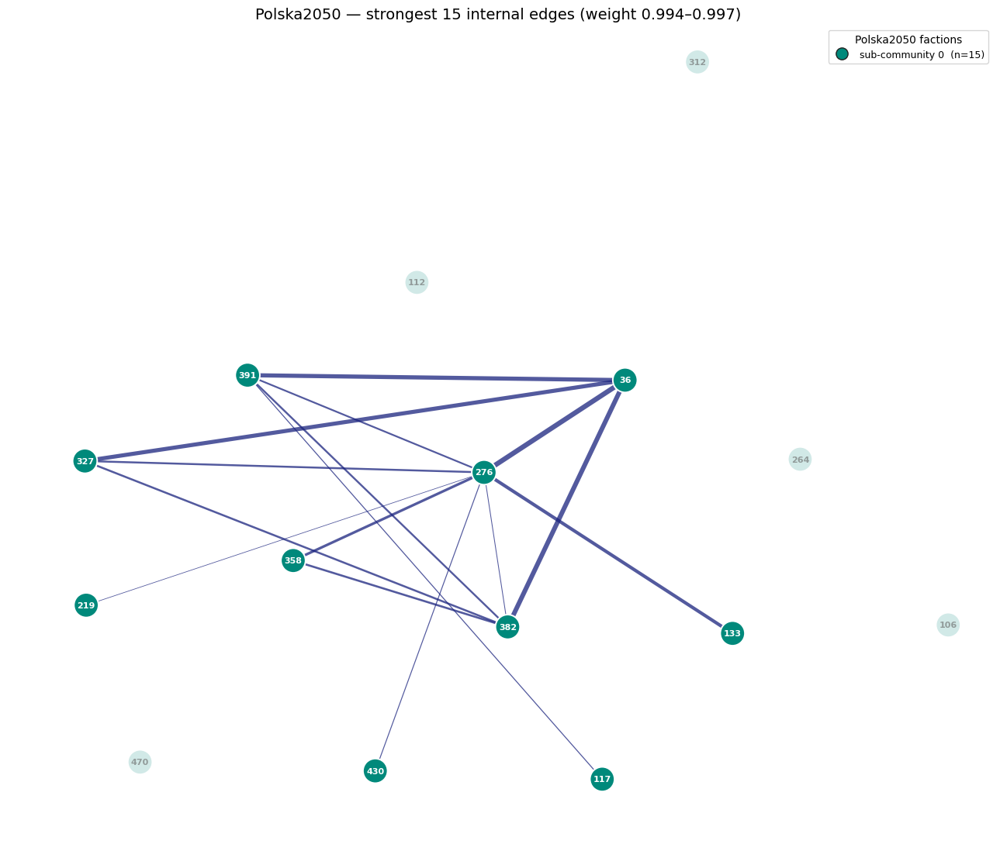

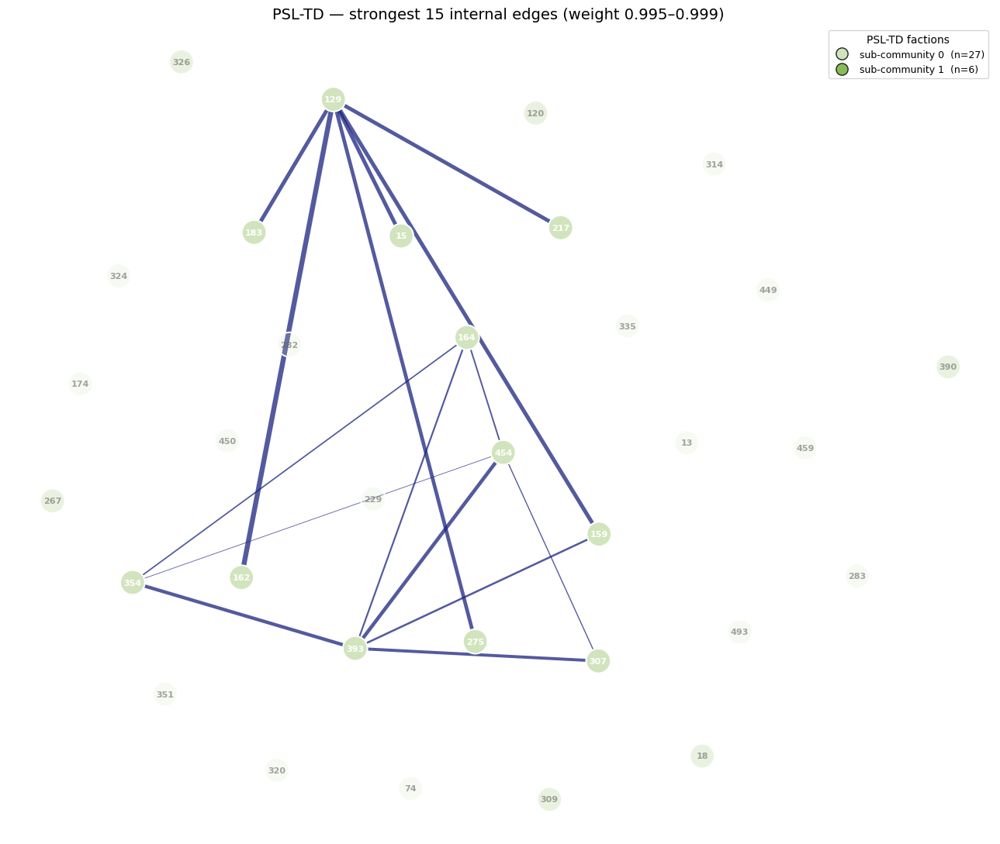

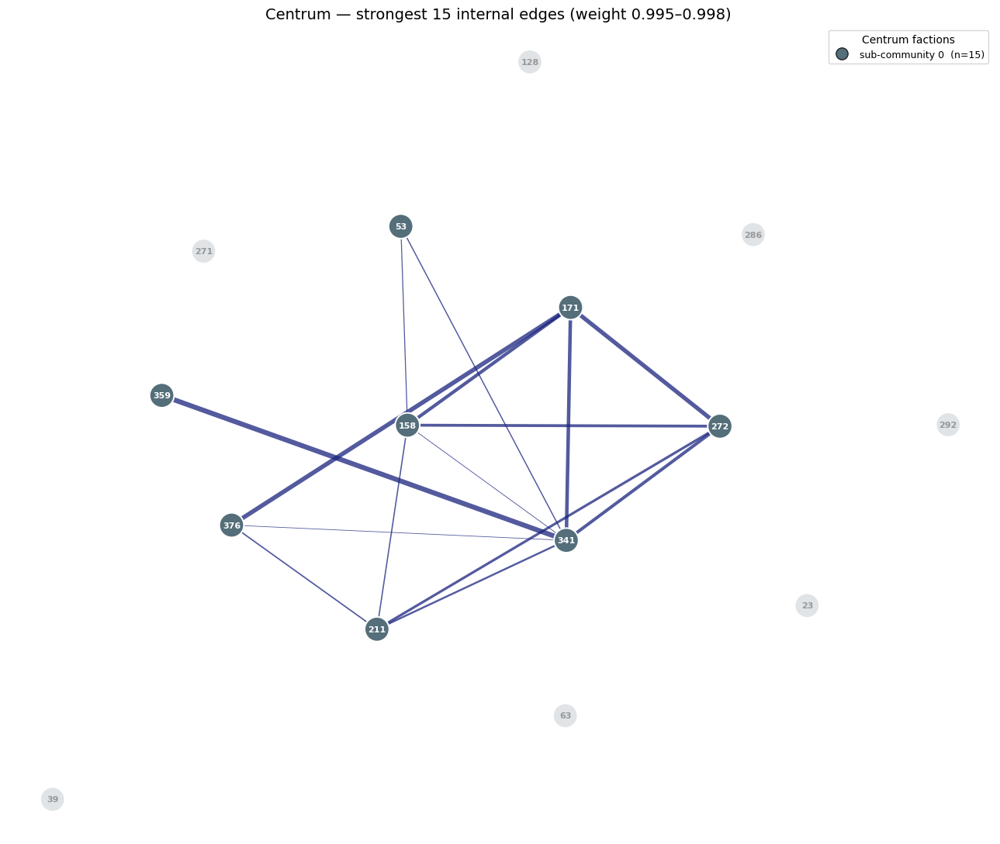

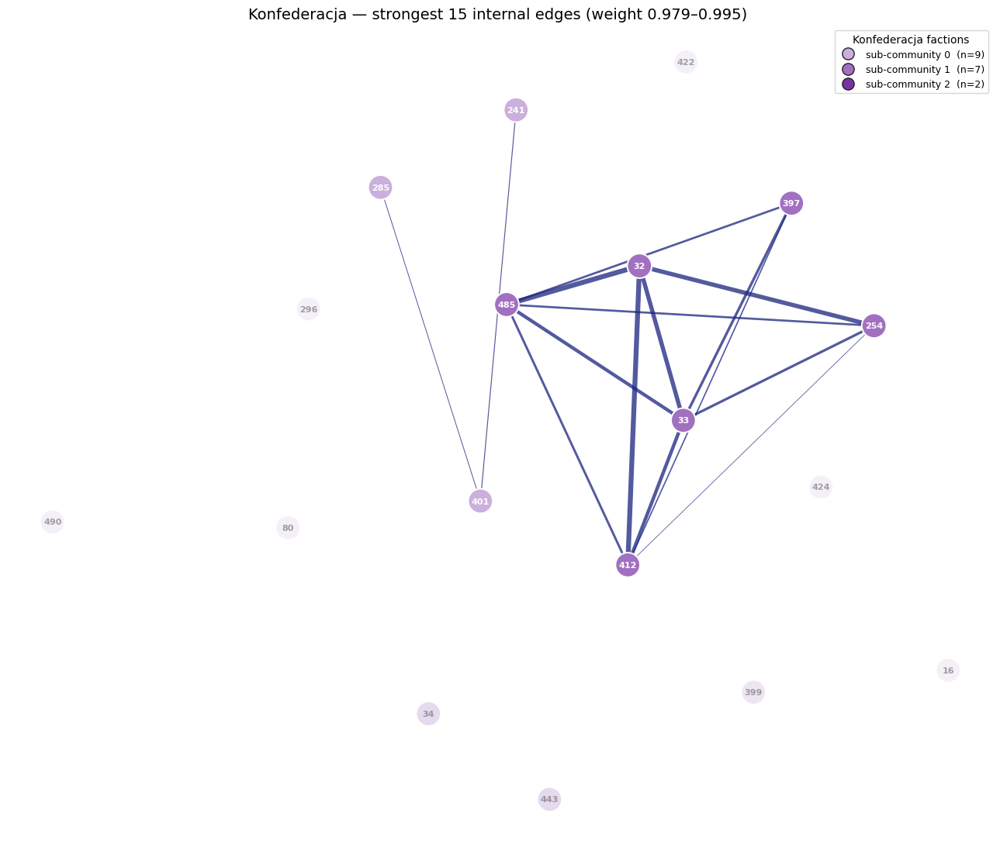

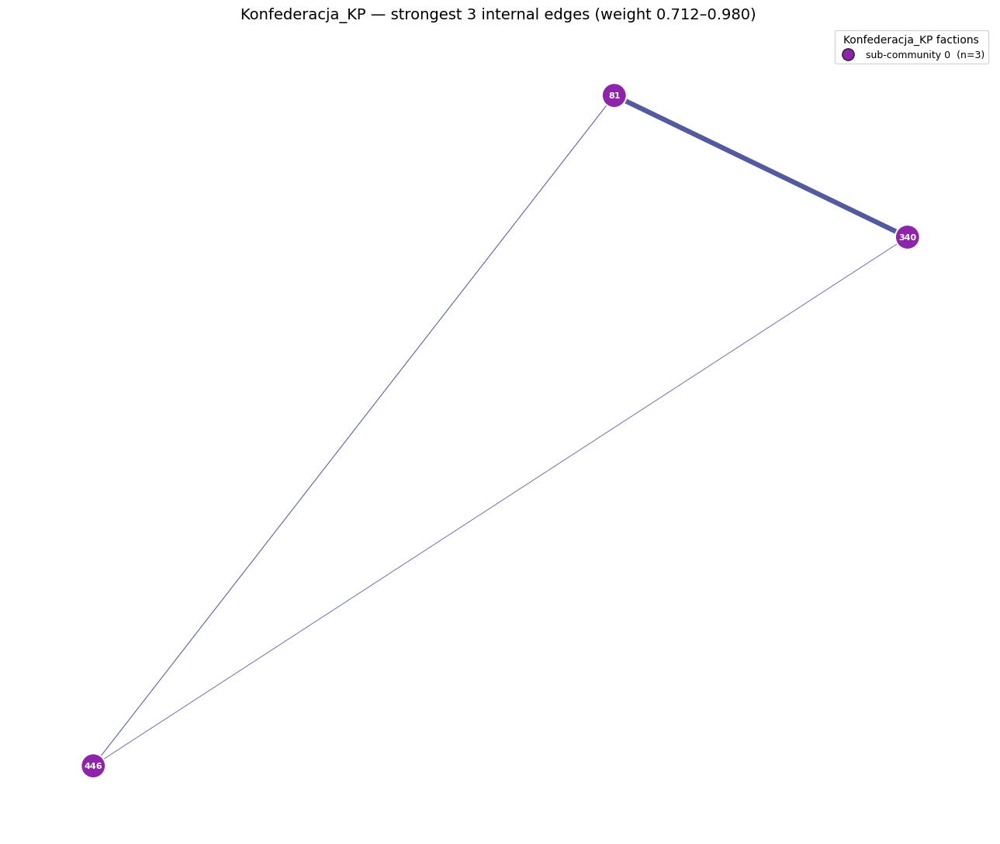

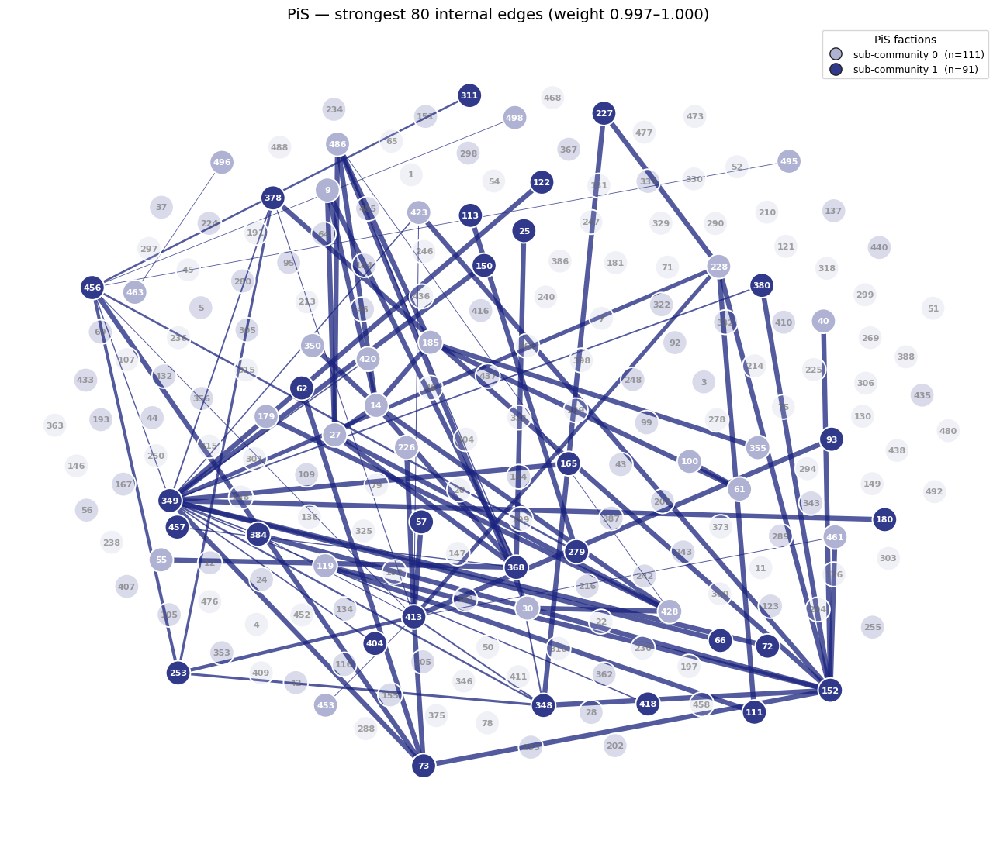

In [14]:
def _pick_extreme_edges(H, *, n_min=15, n_max=80, frac=0.05, mode="top"):
    """Return list of (u, v, data) — the top or bottom `frac` of edges by weight, clamped
    to [n_min, n_max] for readability. mode in {"top", "bottom"}."""
    edges = sorted(H.edges(data=True), key=lambda e: e[2]["weight"], reverse=(mode == "top"))
    n = max(n_min, min(int(len(edges) * frac), n_max))
    n = min(n, len(edges))
    return edges[:n]


def plot_party_extreme_edges(
    club, *, mode, frac=0.05, figsize=(13, 11), node_size=520,
    edge_color=None, title_suffix=None, hide_unconnected=False,
):
    H = party_graphs[club]
    color_of, comms, palette = _community_colors(club)
    pos = _layout_for_party(H)

    selected = _pick_extreme_edges(H, frac=frac, mode=mode)
    sel_weights = np.array([d["weight"] for _, _, d in selected])
    edge_color = edge_color or ("#1A237E" if mode == "top" else "#C62828")

    span = float(np.ptp(sel_weights)) + 1e-9
    if mode == "top":
        # thicker for stronger weight
        norm = (sel_weights - sel_weights.min()) / span
        widths = 0.6 + 4.0 * norm
    else:
        # thicker for *weaker* (more disagreement) — invert
        norm = (sel_weights.max() - sel_weights) / span
        widths = 0.8 + 4.0 * norm

    fig, ax = plt.subplots(figsize=figsize)

    H_sel = nx.Graph()
    H_sel.add_nodes_from(H.nodes(data=True))
    for u, v, d in selected:
        H_sel.add_edge(u, v, **d)
    nx.draw_networkx_edges(H_sel, pos, ax=ax,
                           edge_color=edge_color, width=widths.tolist(), alpha=0.75)

    connected_nodes = {n for u, v, _ in selected for n in (u, v)}

    if not hide_unconnected:
        full_node_color = [color_of[n] for n in H.nodes()]
        full_alpha = [1.0 if n in connected_nodes else 0.18 for n in H.nodes()]
        nx.draw_networkx_nodes(
            H, pos, ax=ax, node_size=node_size, node_color=full_node_color,
            edgecolors="white", linewidths=1.4, alpha=full_alpha,
        )
        for n in H.nodes():
            x, y = pos[n]
            ax.text(
                x, y, str(n),
                fontsize=8, ha="center", va="center", fontweight="bold",
                color="white" if n in connected_nodes else "#666666",
                alpha=1.0 if n in connected_nodes else 0.6,
                zorder=4,
            )
    else:
        sub_nodes = list(connected_nodes)
        nx.draw_networkx_nodes(
            H.subgraph(sub_nodes), pos, ax=ax, node_size=node_size,
            node_color=[color_of[n] for n in sub_nodes],
            edgecolors="white", linewidths=1.4,
        )
        for n in sub_nodes:
            x, y = pos[n]
            ax.text(x, y, str(n), fontsize=8, ha="center", va="center",
                    fontweight="bold", color="white", zorder=4)

    handles, _ = _legend_for_communities(comms, palette, club)
    ax.legend(handles=handles, loc="best", title=f"{club} factions",
              frameon=True, fontsize=9)
    side = "strongest" if mode == "top" else "weakest"
    suffix = title_suffix or ""
    ax.set_title(
        f"{club} — {side} {len(selected)} internal edges "
        f"(weight {sel_weights.min():.3f}–{sel_weights.max():.3f}) {suffix}",
        fontsize=14,
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()


for club in CLUBS_ORDERED:
    plot_party_extreme_edges(club, mode="top", frac=0.005)

### 6.3 Weakest internal connections per party

Same idea, inverted: the lowest-weight edges. These are the **fracture lines** — pairs of MPs in
the same party whose voting agreement is unusually low. Red edges, drawn thicker the lower the
weight. Nodes that don't participate in any of the selected edges are faded.

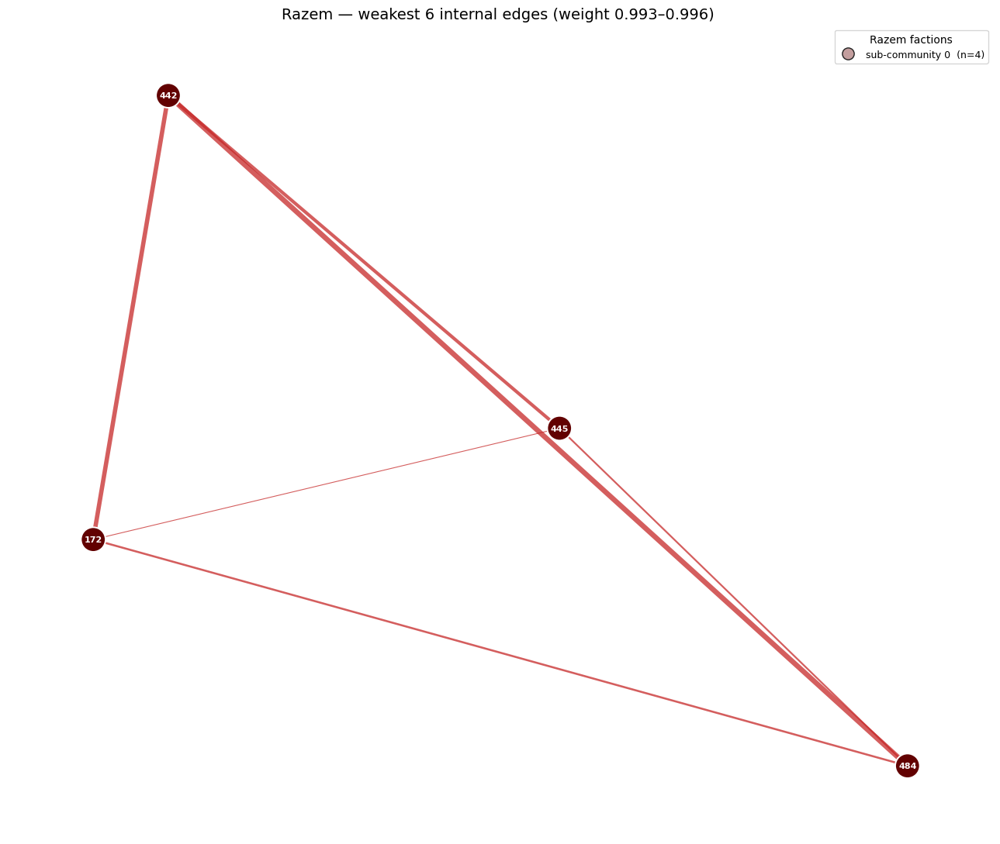

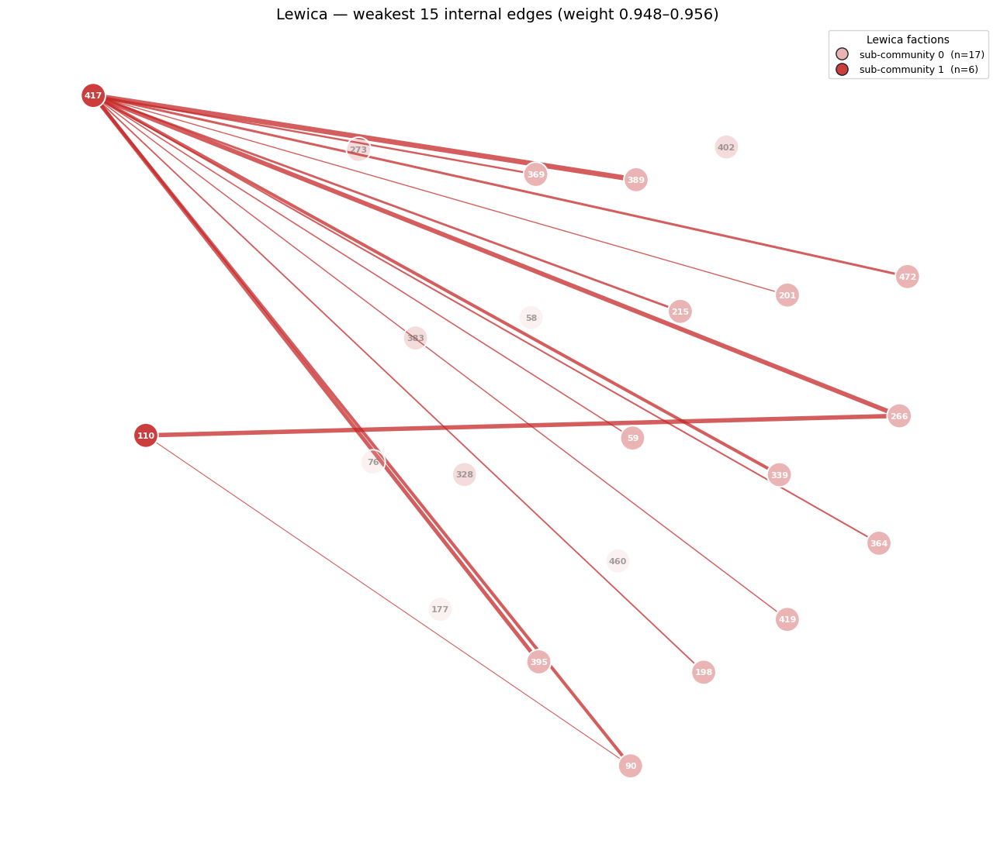

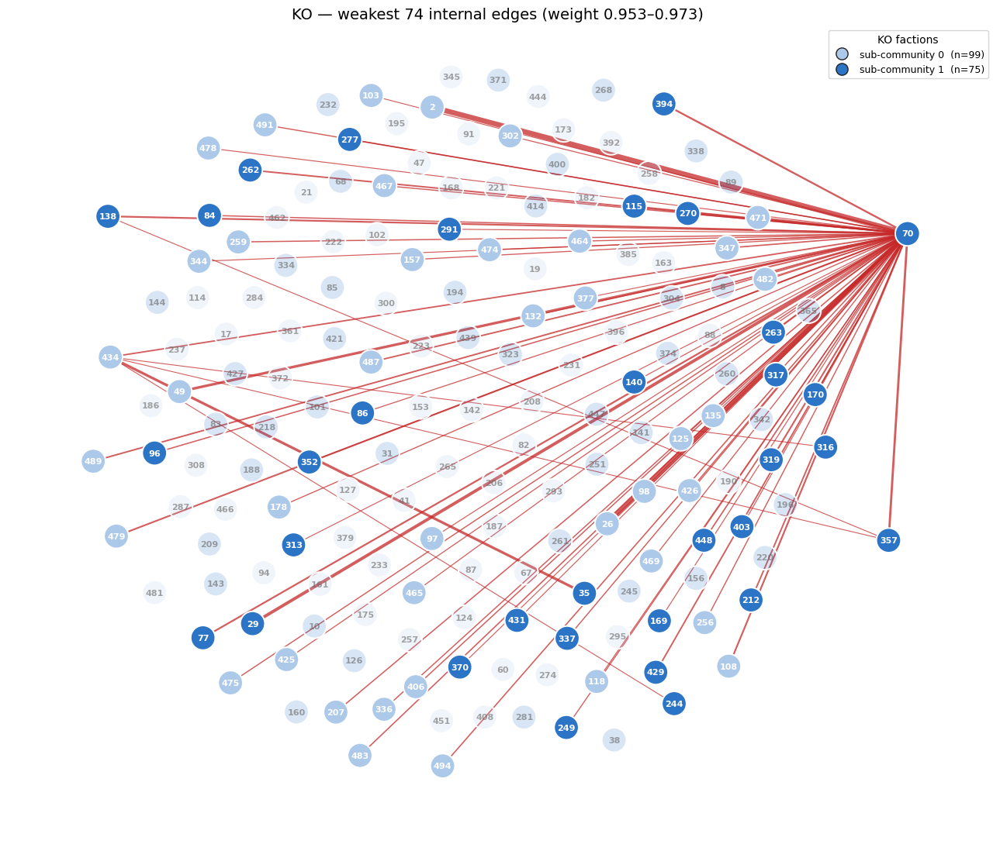

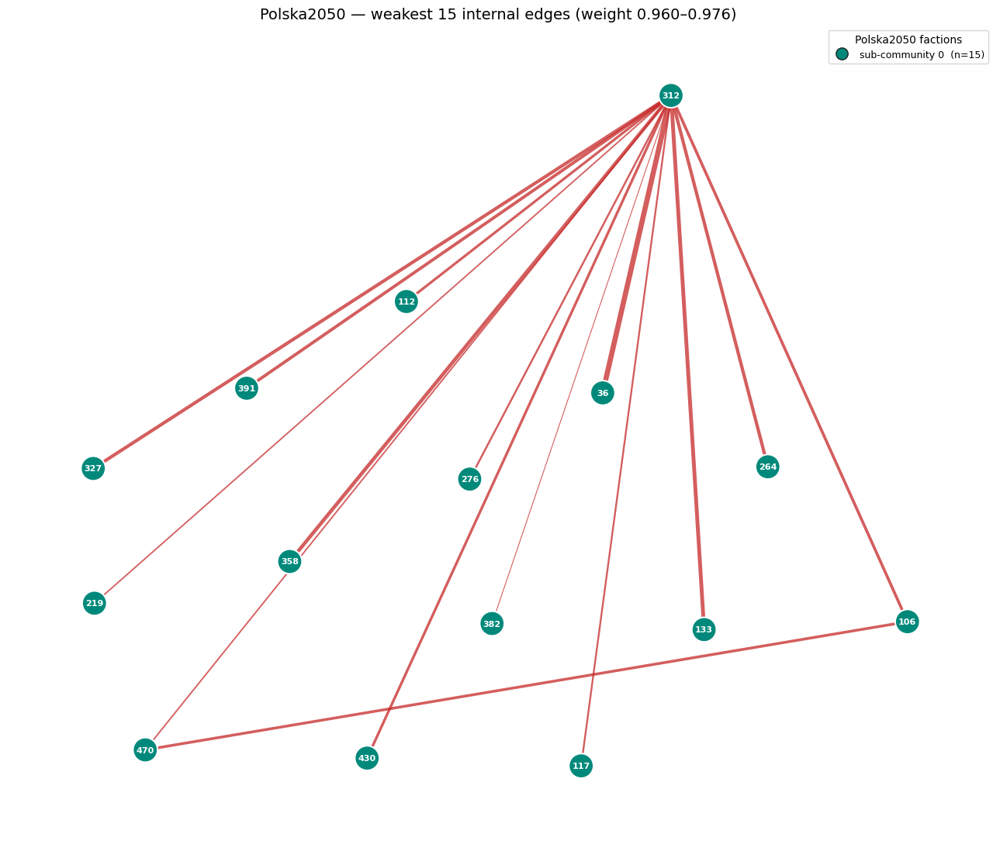

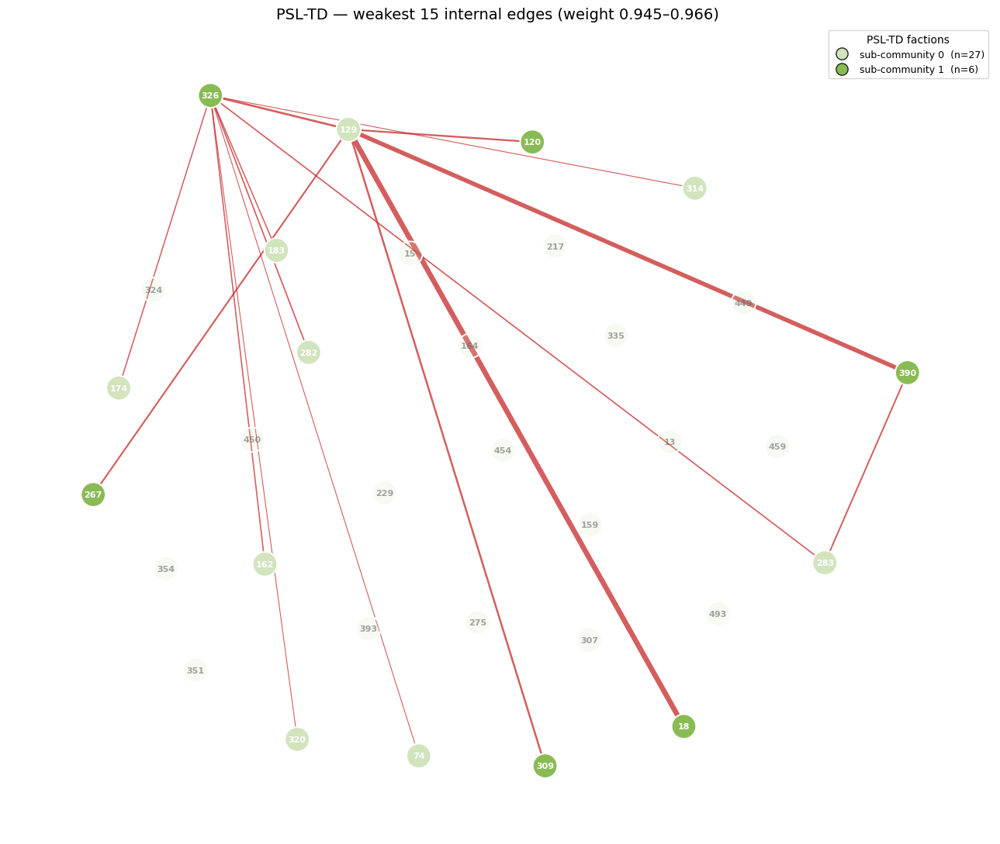

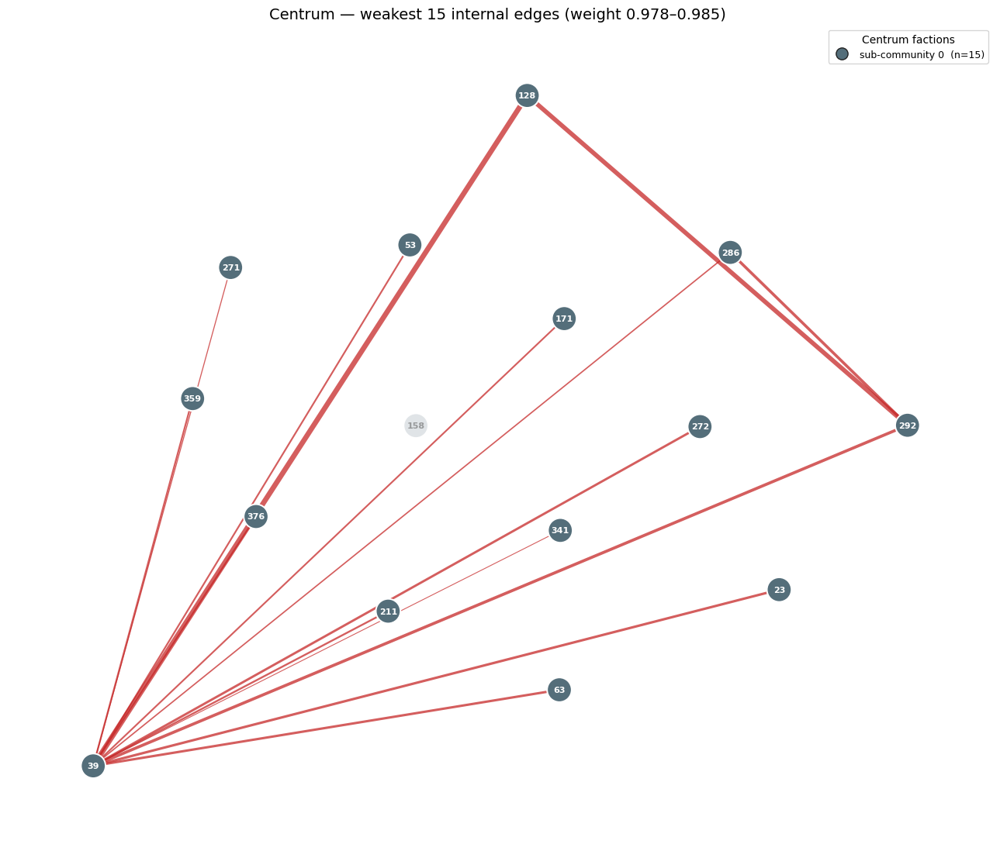

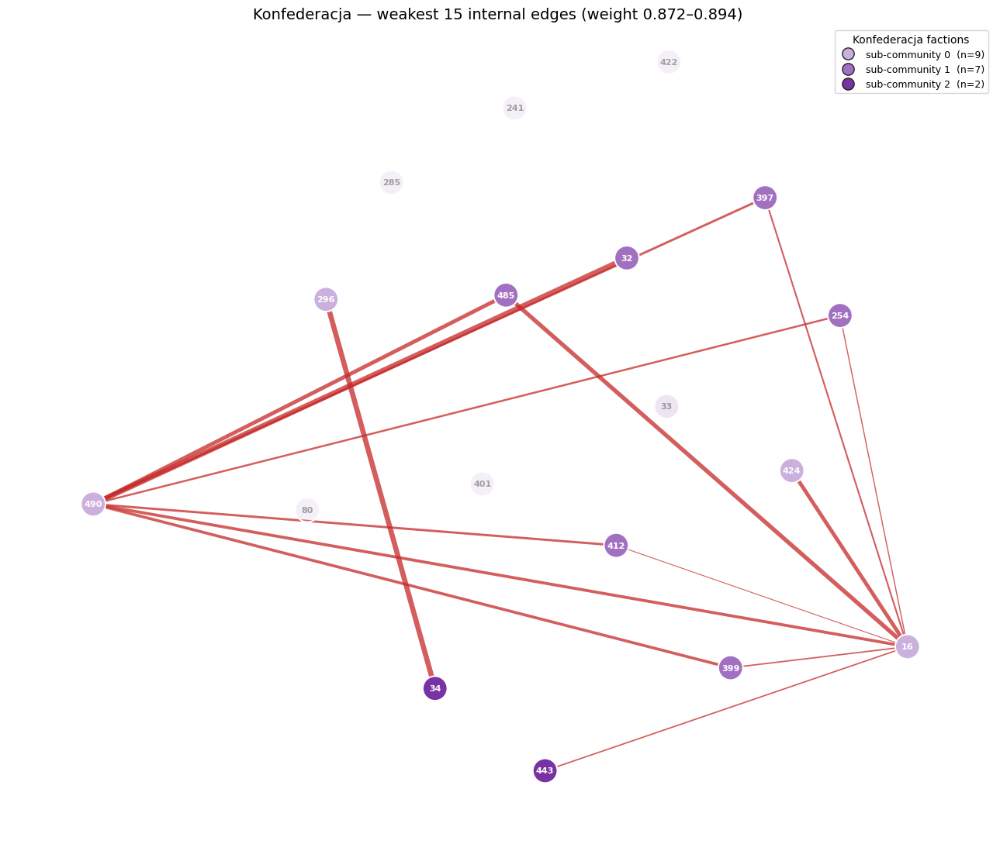

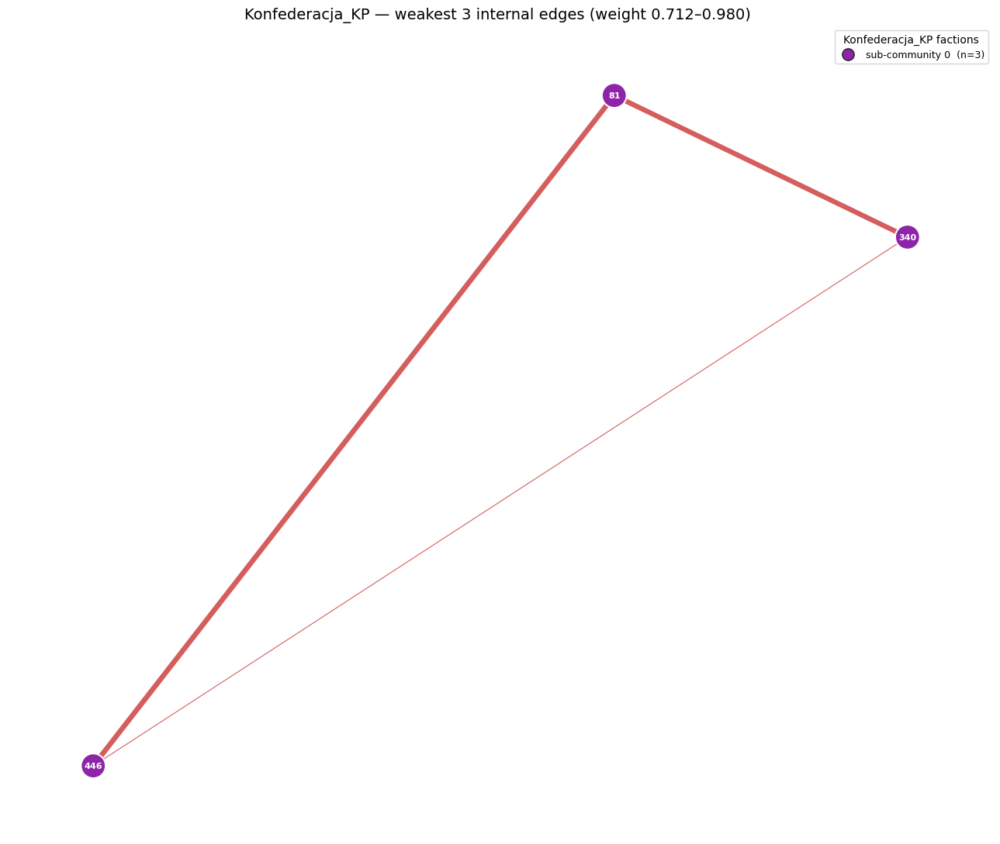

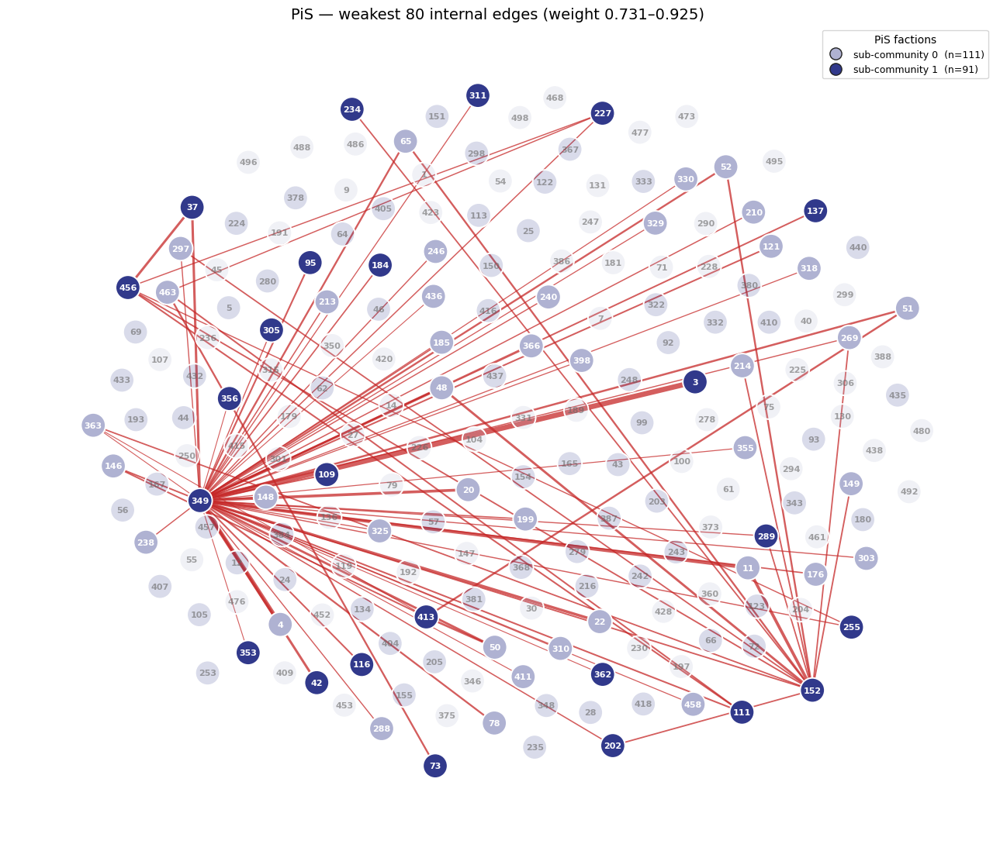

In [15]:
for club in CLUBS_ORDERED:
    plot_party_extreme_edges(club, mode="bottom", frac=0.005)

#### What can we read from §6.3?

The MP ids on the weakest-connections plots are not very useful on their own — let's name the
people involved. Two listings per party:

1. **Weakest internal pairs** — the actual fracture edges, with both MPs' names and
   sub-community ids. Pairs that span the sub-community boundary (`sub_i ≠ sub_j`) are the
   disagreements that drove the Louvain split. Pairs inside the same sub-community are
   *intra-faction* dissent.
2. **Most-dissenting MPs** — ranked by mean agreement with the rest of their own party. A name
   that appears in many weakest pairs *and* near the top of this list is a real outlier; a name
   that only shows up in the pair list usually has noisy/low attendance behind it.


In [87]:
def pairs_table(club: str, top_n: int = 10,min_attendance_fraction:float =0.25,weakest=False) -> pd.DataFrame:
    """Top-n internal pairs by lowest weight, with names + sub-community membership."""
    H = party_graphs[club]
    sub = party_sub_id_sorted(club)
    
    # Filter edges by attendance quantile
    
    clubs_mps = list(H.nodes())
    attendances = {n: int(df_votes[df_votes["MP"] == n].shape[0]) for n in clubs_mps}
    median = pd.Series(attendances).median()
    threshold = median * min_attendance_fraction
    edges = sorted(H.edges(data=True), key=lambda e: e[2]["weight"],reverse= not weakest)
    
    return pd.DataFrame([
        {
            "weight":    round(float(d["weight"]), 4),
            "name_i":    mp_to_name.get(u, str(u)),
            "sub_i":     sub.get(u),
            "MP_i":      u,
            "name_j":    mp_to_name.get(v, str(v)),
            "sub_j":     sub.get(v),
            "MP_j":      v,
            "cross_sub": sub.get(u) != sub.get(v),
            "att_i":     attendances[u],
            "att_j":     attendances[v],
        }
        for u, v, d in edges
        if attendances.get(u, 0) >= threshold and attendances.get(v, 0) >= threshold
    ])[:top_n]
    


def internal_agreement_ranking(club: str, top_n: int = 8, min_attendance_fraction: float = 0.25,weakest=False) -> pd.DataFrame:
    H = party_graphs[club]
    sub = party_sub_id_sorted(club)
    rows = []
    for n in H.nodes():
        ws = [H[n][nb]["weight"] for nb in H.neighbors(n)]
        if not ws:
            continue
        rows.append({
            "name":   mp_to_name.get(n, str(n)),
            "MP":     n,
            "sub":    sub.get(n),
            "mean_internal_w": round(float(np.mean(ws)), 4),
            "min_internal_w":  round(float(np.min(ws)), 4),
            "attendance": int(df_votes[df_votes["MP"] == n].shape[0]),
        })
    
    df = pd.DataFrame(rows)
    
    # filtruj po attendance — tylko MP powyżej zadanego kwantyla
    threshold = df["attendance"].median() * min_attendance_fraction
    df = df[df["attendance"] >= threshold]
    
    return (
        df
        .sort_values("mean_internal_w", ascending= weakest)
        .head(top_n)
        .reset_index(drop=True)
    )
    
def most_subordinate_mps_summary(clubs_list: list, min_attendance_fraction: float = 0.25, weakest: bool = False) -> pd.DataFrame:
    """

    """
    rows = []
    
    for club in clubs_list:
        try:
            
            club_ranking = internal_agreement_ranking(
                club, 
                top_n=1, 
                weakest=weakest, 
                min_attendance_fraction=min_attendance_fraction
            )
            
            if not club_ranking.empty:
  
                mp_data = club_ranking.iloc[0].to_dict()
 
                mp_data = {'club': club, **mp_data}
                rows.append(mp_data)
            else:

                rows.append({
                    'club': club, 
                    'name': None, 
                    'MP': None, 
                    'sub': None, 
                    'mean_internal_w': None,
                    'min_internal_w': None,
                    'attendance': None
                })
                
        except Exception as e:
            print(f"Nie udało się przetworzyć klubu {club}. Błąd: {e}")
            
    summary_df = pd.DataFrame(rows).drop(['sub', 'min_internal_w', 'attendance','MP'], axis=1)

        
    return summary_df



for club in CLUBS_ORDERED:
    print(f"\n=== {club} — 10 weakest internal pairs ===")
    display(pairs_table(club, top_n=10, weakest=True,min_attendance_fraction=0.25))
    print(f"--- {club} — 8 most-dissenting MPs (lowest mean internal agreement) ---")
    display(internal_agreement_ranking(club, top_n=8, weakest=True,min_attendance_fraction=0.25))



=== Razem — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9928,Adrian Zandberg,0,442,Marta Stożek,0,484,False,3479,3236
1,0.9934,Marta Stożek,0,484,Maciej Konieczny,0,172,False,3236,3582
2,0.9942,Adrian Zandberg,0,442,Maciej Konieczny,0,172,False,3479,3582
3,0.9952,Adrian Zandberg,0,442,Marcelina Zawisza,0,445,False,3479,3599
4,0.9954,Marta Stożek,0,484,Marcelina Zawisza,0,445,False,3236,3599
5,0.9961,Maciej Konieczny,0,172,Marcelina Zawisza,0,445,False,3582,3599


--- Razem — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Marta Stożek,484,0,0.9939,0.9928,3236
1,Adrian Zandberg,442,0,0.9941,0.9928,3479
2,Maciej Konieczny,172,0,0.9946,0.9934,3582
3,Marcelina Zawisza,445,0,0.9956,0.9952,3599



=== Lewica — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9485,Wanda Nowicka,0,266,Joanna Wicha,1,417,True,3362,3627
1,0.9495,Joanna Wicha,1,417,Krzysztof Gawkowski,1,90,False,3627,3625
2,0.9498,Joanna Wicha,1,417,Arkadiusz Sikora,0,339,True,3627,3653
3,0.9506,Joanna Wicha,1,417,Piotr Kowal,0,472,True,3627,3273
4,0.9517,Joanna Wicha,1,417,Łukasz Litewka,0,215,True,3627,3405
5,0.9518,Joanna Wicha,1,417,Andrzej Szejna,0,369,True,3627,3359
6,0.9532,Joanna Wicha,1,417,Wiesław Szczepański,0,364,True,3627,3739
7,0.9534,Joanna Wicha,1,417,Anita Kucharska-Dziedzic,0,198,True,3627,3653
8,0.9539,Krzysztof Gawkowski,1,90,Daria Gosek-Popiołek,1,110,False,3625,3486
9,0.9544,Tomasz Trela,0,395,Joanna Wicha,1,417,True,3753,3627


--- Lewica — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Joanna Wicha,417,1,0.9599,0.9485,3627
1,Daria Gosek-Popiołek,110,1,0.9662,0.9539,3486
2,Dorota Olko,273,1,0.9737,0.9637,3343
3,Krzysztof Gawkowski,90,1,0.9826,0.9495,3625
4,Arkadiusz Sikora,339,0,0.9859,0.9498,3653
5,Katarzyna Ueberhan,402,1,0.9862,0.9617,3622
6,Wanda Nowicka,266,0,0.9863,0.9485,3362
7,Andrzej Szejna,369,0,0.9867,0.9518,3359



=== KO — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9531,Robert Dowhan,1,70,Franciszek Sterczewski,1,357,False,2983,3296
1,0.9628,Robert Dowhan,1,70,Małgorzata Tracz,1,394,False,2983,3787
2,0.9650,Robert Dowhan,1,70,Magdalena Filiks,1,77,False,2983,2843
3,0.9650,Robert Dowhan,1,70,Klaudia Jachira,1,138,False,2983,3688
4,0.9668,Robert Dowhan,1,70,Stanisław Gorczyca,1,108,False,2983,3751
5,0.9683,Robert Dowhan,1,70,Krzysztof Mieszkowski,0,479,True,2983,3300
6,0.9689,Robert Dowhan,1,70,Marek Rząsa,1,319,False,2983,3786
7,0.9691,Robert Dowhan,1,70,Sławomir Nitras,1,262,False,2983,3229
8,0.9693,Klaudia Jachira,1,138,Franciszek Sterczewski,1,357,False,3688,3296
9,0.9694,Robert Dowhan,1,70,Bożena Lisowska,0,489,True,2983,3298


--- KO — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Robert Dowhan,70,1,0.9748,0.9531,2983
1,Franciszek Sterczewski,357,1,0.9785,0.9531,3296
2,Klaudia Jachira,138,1,0.9817,0.9650,3688
3,Małgorzata Tracz,394,1,0.9868,0.9628,3787
4,Stanisław Gorczyca,108,1,0.9909,0.9668,3751
5,Bogusław Wołoszański,434,0,0.9919,0.9530,2107
6,Magdalena Filiks,77,1,0.9921,0.9650,2843
7,Marek Rząsa,319,1,0.9931,0.9689,3786



=== Polska2050 — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9604,Bożenna Hołownia,0,470,Bartosz Romowicz,0,312,False,2727,3645
1,0.9654,Adam Gomoła,0,106,Bartosz Romowicz,0,312,False,3480,3645
2,0.9663,Szymon Hołownia,0,133,Bartosz Romowicz,0,312,False,3445,3645
3,0.9672,Michał Gramatyka,0,117,Bartosz Romowicz,0,312,False,3558,3645
4,0.9673,Kamil Wnuk,0,430,Bartosz Romowicz,0,312,False,3578,3645
5,0.9681,Ewa Schädler,0,327,Bartosz Romowicz,0,312,False,3643,3645
6,0.9688,Bartosz Romowicz,0,312,Adam Luboński,0,219,False,3645,3637
7,0.9693,Maja Nowak,0,264,Bartosz Romowicz,0,312,False,3624,3645
8,0.9697,Agnieszka Buczyńska,0,36,Bartosz Romowicz,0,312,False,2950,3645
9,0.9701,Wioleta Tomczak,0,391,Bartosz Romowicz,0,312,False,3719,3645


--- Polska2050 — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Bartosz Romowicz,312,0,0.9690,0.9604,3645
1,Adam Gomoła,106,0,0.9805,0.9654,3480
2,Bożenna Hołownia,470,0,0.9848,0.9604,2727
3,Piotr Górnikiewicz,112,0,0.9850,0.9741,3718
4,Szymon Hołownia,133,0,0.9871,0.9663,3445
5,Maja Nowak,264,0,0.9875,0.9693,3624
6,Michał Gramatyka,117,0,0.9880,0.9672,3558
7,Kamil Wnuk,430,0,0.9887,0.9673,3578



=== PSL-TD — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9627,Wiesław Różyński,0,314,Marek Sawicki,0,326,False,3660,3731
1,0.9637,Jacek Tomczak,0,390,Krzysztof Paszyk,2,283,True,3293,3509
2,0.9637,Jarosław Rzepa,1,320,Marek Sawicki,0,326,True,3615,3731
3,0.9641,Władysław Kosiniak-Kamysz,1,174,Marek Sawicki,0,326,True,3086,3731
4,0.9643,Urszula Pasławska,2,282,Marek Sawicki,0,326,True,3310,3731
5,0.9644,Dariusz Klimczak,1,162,Marek Sawicki,0,326,True,3704,3731
6,0.9659,Stefan Krajewski,1,183,Marek Sawicki,0,326,True,3647,3731
7,0.9659,Marek Sawicki,0,326,Adam Dziedzic,1,74,True,3731,3674
8,0.9660,Krzysztof Paszyk,2,283,Marek Sawicki,0,326,True,3509,3731
9,0.9660,Tadeusz Samborski,1,324,Marek Sawicki,0,326,True,3655,3731


--- PSL-TD — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Marek Sawicki,326,0,0.9686,0.9602,3731
1,Jacek Tomczak,390,0,0.9714,0.9490,3293
2,Krzysztof Paszyk,283,2,0.9797,0.9637,3509
3,Wiesław Różyński,314,0,0.9798,0.9627,3660
4,Urszula Pasławska,282,2,0.9798,0.9643,3310
5,Andrzej Grzyb,120,0,0.9815,0.9614,3344
6,Urszula Nowogórska,267,0,0.9823,0.9620,3743
7,Ireneusz Raś,309,0,0.9825,0.9607,3283



=== Centrum — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9778,Paulina Hennig-Kloska,0,128,Elżbieta Burkiewicz,0,39,False,3735,3686
1,0.9790,Elżbieta Burkiewicz,0,39,Izabela Bodnar,0,23,False,3686,3552
2,0.9813,Paulina Hennig-Kloska,0,128,Norbert Pietrykowski,0,292,False,3735,3247
3,0.9815,Elżbieta Burkiewicz,0,39,Sławomir Ćwik,0,63,False,3686,3764
4,0.9821,Elżbieta Burkiewicz,0,39,Barbara Oliwiecka,0,272,False,3686,3659
5,0.9822,Elżbieta Burkiewicz,0,39,Aleksandra Leo,0,211,False,3686,3687
6,0.9823,Elżbieta Burkiewicz,0,39,Mirosław Suchoń,0,359,False,3686,3626
7,0.9830,Norbert Pietrykowski,0,292,Elżbieta Burkiewicz,0,39,False,3247,3686
8,0.9831,Elżbieta Burkiewicz,0,39,Żaneta Cwalina-Śliwowska,0,53,False,3686,3643
9,0.9832,Elżbieta Burkiewicz,0,39,Rafał Komarewicz,0,171,False,3686,3653


--- Centrum — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Elżbieta Burkiewicz,39,0,0.9824,0.9778,3686
1,Norbert Pietrykowski,292,0,0.9870,0.9813,3247
2,Paulina Hennig-Kloska,128,0,0.9872,0.9778,3735
3,Izabela Bodnar,23,0,0.9896,0.9790,3552
4,Sławomir Ćwik,63,0,0.9900,0.9815,3764
5,Ryszard Petru,286,0,0.9902,0.9835,3092
6,Barbara Okuła,271,0,0.9910,0.9838,3788
7,Mirosław Suchoń,359,0,0.9920,0.9823,3626



=== Konfederacja — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.8715,Michał Połuboczek,0,490,Konrad Berkowicz,0,16,False,2867,2993
1,0.8717,Konrad Berkowicz,0,16,Andrzej Zapałowski,1,443,True,2993,3572
2,0.8767,Michał Połuboczek,0,490,Witold Tumanowicz,1,399,True,2867,3659
3,0.8784,Witold Tumanowicz,1,399,Konrad Berkowicz,0,16,True,3659,2993
4,0.8788,Michał Połuboczek,0,490,Krzysztof Tuduj,1,397,True,2867,3154
5,0.8832,Krzysztof Tuduj,1,397,Konrad Berkowicz,0,16,True,3154,2993
6,0.8836,Krzysztof Szymański,1,485,Konrad Berkowicz,0,16,True,3247,2993
7,0.8867,Przemysław Wipler,0,424,Konrad Berkowicz,0,16,False,2875,2993
8,0.8867,Michał Połuboczek,0,490,Michał Wawer,1,412,True,2867,3736
9,0.8900,Krzysztof Szymański,1,485,Michał Połuboczek,0,490,True,3247,2867


--- Konfederacja — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Michał Połuboczek,490,0,0.8961,0.8715,2867
1,Konrad Berkowicz,16,0,0.8995,0.8715,2993
2,Bronisław Foltyn,80,0,0.9181,0.8984,3484
3,Andrzej Zapałowski,443,1,0.9203,0.8717,3572
4,Ryszard Wilk,422,0,0.9264,0.8959,2580
5,Witold Tumanowicz,399,1,0.9270,0.8767,3659
6,Grzegorz Płaczek,296,0,0.9287,0.8885,3470
7,Przemysław Wipler,424,0,0.9302,0.8867,2875



=== Konfederacja_KP — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.7117,Włodzimierz Skalik,0,340,Sławomir Zawiślak,0,446,False,3681,3481
1,0.7219,Roman Fritz,0,81,Sławomir Zawiślak,0,446,False,3508,3481
2,0.9802,Roman Fritz,0,81,Włodzimierz Skalik,0,340,False,3508,3681


--- Konfederacja_KP — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Sławomir Zawiślak,446,0,0.7168,0.7117,3481
1,Włodzimierz Skalik,340,0,0.8460,0.7117,3681
2,Roman Fritz,81,0,0.8511,0.7219,3508



=== PiS — 10 weakest internal pairs ===


,weight,name_i,sub_i,MP_i,name_j,sub_j,MP_j,cross_sub,att_i,att_j
0,0.9376,Janusz Cieszyński,0,51,Dariusz Matecki,1,234,True,3233,2849
1,0.9378,Paweł Jabłoński,2,137,Dariusz Matecki,1,234,True,3255,2849
2,0.9411,Janusz Cieszyński,0,51,Bartłomiej Wróblewski,2,440,True,3233,3006
3,0.9429,Bartłomiej Wróblewski,2,440,Bogumiła Olbryś,0,496,True,3006,1469
4,0.9451,Bartłomiej Wróblewski,2,440,Michał Jach,0,495,True,3006,1408
5,0.9458,Dariusz Matecki,1,234,Bartłomiej Wróblewski,2,440,True,2849,3006
6,0.9467,Janusz Cieszyński,0,51,Ireneusz Zyska,1,458,True,3233,3695
7,0.9468,Dariusz Matecki,1,234,Monika Pawłowska,1,463,False,2849,2007
8,0.9474,Janusz Cieszyński,0,51,Marek Wesoły,1,416,True,3233,3509
9,0.9477,Janusz Cieszyński,0,51,Wojciech Szarama,0,363,False,3233,3118


--- PiS — 8 most-dissenting MPs (lowest mean internal agreement) ---


,name,MP,sub,mean_internal_w,min_internal_w,attendance
0,Janusz Cieszyński,51,0,0.9559,0.8627,3233
1,Dariusz Matecki,234,1,0.9595,0.9119,2849
2,Bartłomiej Wróblewski,440,2,0.9630,0.9272,3006
3,Paweł Jabłoński,137,2,0.9643,0.8927,3255
4,Maria Kurowska,202,1,0.9675,0.9114,3697
5,Wojciech Szarama,363,0,0.9714,0.8886,3118
6,Krzysztof Ciecióra,50,1,0.9721,0.7309,3723
7,Michał Kowalski,473,1,0.9728,0.9532,3051


In [28]:
print("\n=== Zestawienie najbardziej niesubordynowanych posłów w każdym klubie ===")
df_summary = most_subordinate_mps_summary(CLUBS_ORDERED, min_attendance_fraction=0.25, weakest=False)
df_summary.columns =['Klub','Imię i nazwisko','Średnia zgodność z resztą klubu']
display(df_summary)


=== Zestawienie najbardziej niesubordynowanych posłów w każdym klubie ===


,Klub,Imię i nazwisko,Średnia zgodność z resztą klubu
0,Razem,Marcelina Zawisza,0.9956
1,Lewica,Jacek Czerniak,0.9891
2,KO,Robert Jagła,0.9979
3,Polska2050,Łukasz Osmalak,0.9919
4,PSL-TD,Henryk Kiepura,0.9893
5,Centrum,Marcin Skonieczka,0.9940
6,Konfederacja,Karina Bosak,0.9479
7,Konfederacja_KP,Roman Fritz,0.8511
8,PiS,Paweł Szefernaker,0.9892


### 6.4 Global view: full graph with (party, sub-community) colouring

Party = base hue, sub-community = shade. Lets you spot whether a faction in one party visually
neighbours a faction in another (cross-party affinity) when laid out by club.

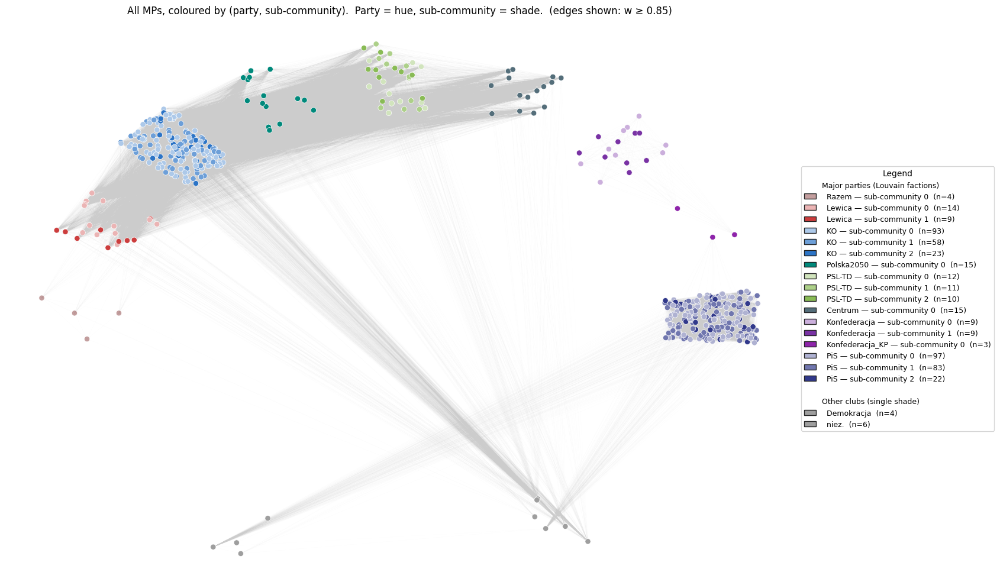

In [88]:
# Global view: full graph laid out by club, re-coloured by (party, sub-community)
from collections import Counter

from matplotlib.collections import LineCollection
from matplotlib.patches import Patch

from utils.graph.layout.layout import compute_club_layout

# Build (mp -> color) and remember each (party, sub_id) -> (color, size) for the legend
global_color = {}
party_sub_palettes = {}   # club -> list[(sub_id, color, size)]
for club, info in party_louvain.items():
    comms = sorted(info["communities"], key=len, reverse=True)
    palette = _shade_palette(DEFAULT_CLUB_COLORS.get(club, "#555555"), len(comms))
    party_sub_palettes[club] = [(cid, palette[cid], len(comm)) for cid, comm in enumerate(comms)]
    for cid, comm in enumerate(comms):
        for mp in comm:
            global_color[mp] = palette[cid]

# Minor / unanalysed clubs: fall back to base club color
minor_club_counts = Counter()
for mp in G.nodes():
    if mp not in global_color:
        club = G.nodes[mp].get("club")
        global_color[mp] = DEFAULT_CLUB_COLORS.get(club, "#9E9E9E")
        minor_club_counts[club or "—"] += 1

# Plot
pos = compute_club_layout(G, clubs_ordered=CLUBS_ORDERED, jitter=0.1, seed=RNG_SEED)

fig, ax = plt.subplots(figsize=(17, 10))

EDGE_THRESHOLD = 0.85
segments = [
    [(pos[u][0], pos[u][1]), (pos[v][0], pos[v][1])]
    for u, v, d in G.edges(data=True)
    if d["weight"] >= EDGE_THRESHOLD
]
ax.add_collection(LineCollection(segments, colors="#cccccc", linewidths=0.3, alpha=0.05, zorder=1))

xs = [pos[n][0] for n in G.nodes()]
ys = [pos[n][1] for n in G.nodes()]
cs = [global_color[n] for n in G.nodes()]
ax.scatter(xs, ys, c=cs, s=45, edgecolors="white", linewidths=0.5, zorder=2)
ax.set_title(
    f"All MPs, coloured by (party, sub-community).  "
    f"Party = hue, sub-community = shade.  (edges shown: w ≥ {EDGE_THRESHOLD})"
)
ax.autoscale_view()
ax.axis("off")

# ---- Legend: grouped by party, sub-community shades within each party ------------
def _section_handle(label):
    """Invisible marker — used as a bold sub-heading inside the legend."""
    return Patch(facecolor="none", edgecolor="none", label=label)

handles = [_section_handle("Major parties (Louvain factions)")]
for club in CLUBS_ORDERED:
    if club not in party_sub_palettes:
        continue
    for cid, color, size in party_sub_palettes[club]:
        handles.append(Patch(facecolor=color, edgecolor="#222",
                             label=f"  {club} — sub-community {cid}  (n={size})"))

if minor_club_counts:
    handles.append(_section_handle(""))   # spacer
    handles.append(_section_handle("Other clubs (single shade)"))
    for club in CLUBS_ORDERED:
        if club in party_sub_palettes or club not in minor_club_counts:
            continue
        handles.append(Patch(
            facecolor=DEFAULT_CLUB_COLORS.get(club, "#9E9E9E"),
            edgecolor="#222",
            label=f"  {club}  (n={minor_club_counts[club]})",
        ))
    # any clubs not in CLUBS_ORDERED at all
    for club, n in minor_club_counts.items():
        if club in party_sub_palettes or club in CLUBS_ORDERED:
            continue
        handles.append(Patch(
            facecolor=DEFAULT_CLUB_COLORS.get(club, "#9E9E9E"),
            edgecolor="#222",
            label=f"  {club}  (n={n})",
        ))

ax.legend(
    handles=handles,
    loc="center left",
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    fontsize=9,
    handlelength=1.6,
    borderaxespad=0.0,
    title="Legend",
)

plt.tight_layout()
plt.show()

## 7. Validating against the documented PiS factions: *harcerze* vs *maślarze*


In [81]:
HARCERZE = [
    "Mateusz Morawiecki",
    "Michał Dworczyk",
    "Janusz Cieszyński",
    "Piotr Müller",
]
MASLARZE = [
    "Przemysław Czarnek",      
    "Jacek Sasin",      
    "Zbigniew Ziobro",
]


def find_mp_by_name(full_name: str):
    """Look up MP id by 'First Last'. Returns None if not in the dataset."""
    first, _, last = full_name.partition(" ")
    matches = df_members[(df_members["firstName"] == first) & (df_members["lastName"] == last)]
    return int(matches.iloc[0]["MP"]) if not matches.empty else None


def party_sub_id_sorted(club: str) -> dict:
    """MP -> sub-community id, with sub-communities renumbered by descending size
    (matches the numbering used in roster tables and visualisations above)."""
    comms = sorted(party_louvain[club]["communities"], key=len, reverse=True)
    return {mp: cid for cid, comm in enumerate(comms) for mp in comm}


pis_sub = party_sub_id_sorted("PiS")

faction_rows = []
for label, names in [("harcerze", HARCERZE), ("maślarze", MASLARZE)]:
    for full in names:
        mp_id = find_mp_by_name(full)
        faction_rows.append({
            "faction": label,
            "name": full,
            "MP": mp_id,
            "in_sejm": mp_id is not None,
            "club": mp_to_club.get(mp_id) if mp_id is not None else None,
            "sub_community": pis_sub.get(mp_id) if mp_id is not None else None,
        })
df_factions = pd.DataFrame(faction_rows)
df_factions


,faction,name,MP,in_sejm,club,sub_community
0,harcerze,Mateusz Morawiecki,246,True,PiS,0
1,harcerze,Michał Dworczyk,73,True,PiS,2
2,harcerze,Janusz Cieszyński,51,True,PiS,0
3,harcerze,Piotr Müller,255,True,PiS,2
4,maślarze,Przemysław Czarnek,56,True,PiS,1
5,maślarze,Jacek Sasin,325,True,PiS,0
6,maślarze,Zbigniew Ziobro,456,True,PiS,1


In [82]:
# Verdict: do harcerze and maślarze fall into different Louvain sub-communities?
present = df_factions[df_factions["in_sejm"] & (df_factions["club"] == "PiS")].copy()

if present.empty:
    print("None of the named PiS faction members appear in the dataset.")
else:
    crosstab = (
        present.groupby(["faction", "sub_community"])
        .size()
        .unstack(fill_value=0)
        .astype(int)
    )
    print("Sub-community membership of named PiS faction members:")
    display(crosstab)

    h_subs = set(present[present["faction"] == "harcerze"]["sub_community"])
    m_subs = set(present[present["faction"] == "maślarze"]["sub_community"])
    n_pis_comms = len(party_louvain["PiS"]["communities"])
    overlap = h_subs & m_subs

    if not h_subs or not m_subs:
        absent = "harcerze" if not h_subs else "maślarze"
        print(f"\nCannot validate: no {absent} member is in the data.")
    elif n_pis_comms == 1:
        print("\nLouvain found only one PiS sub-community — no factional split detected.")
    elif not overlap and len(h_subs) == 1 and len(m_subs) == 1:
        print(
            f"\n[MATCH] Louvain split lines up with the documented division: "
            f"harcerze in sub-community {next(iter(h_subs))}, "
            f"maślarze in sub-community {next(iter(m_subs))}."
        )
    elif not overlap:
        print(
            f"\n[PARTIAL MATCH] Each faction is split across more than one sub-community, "
            f"but harcerze and maślarze occupy disjoint sets: {h_subs} vs {m_subs}."
        )
    else:
        print(
            f"\n[MIXED] Factions overlap in sub-community(ies) {overlap}. "
            f"The Louvain partition does not cleanly separate harcerze and maślarze."
        )

Sub-community membership of named PiS faction members:


sub_community,0,1,2
faction,,,
harcerze,2,0,2
maślarze,1,2,0



[MIXED] Factions overlap in sub-community(ies) {0}. The Louvain partition does not cleanly separate harcerze and maślarze.


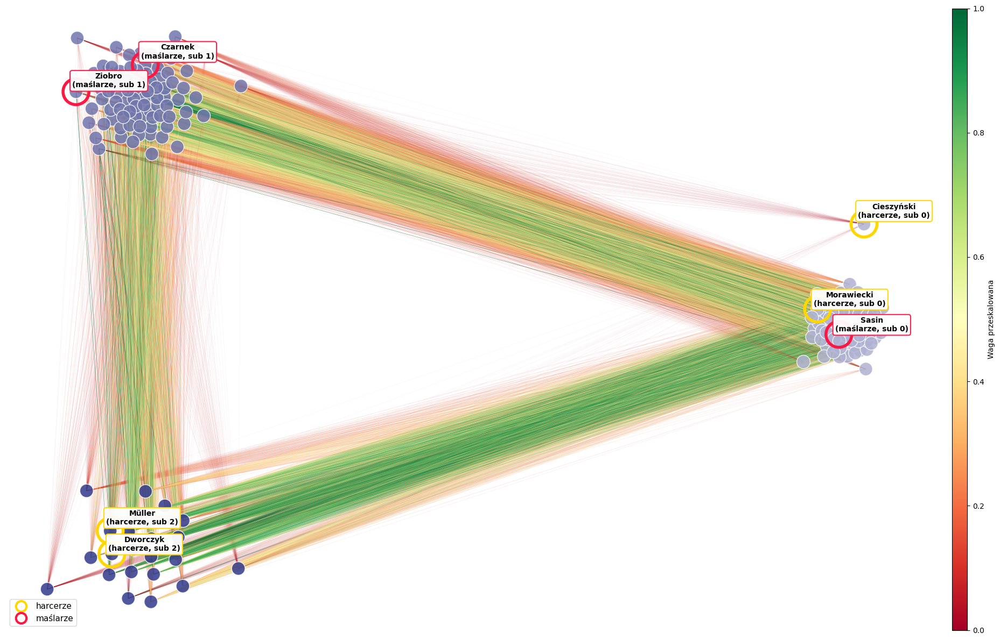

In [90]:
from adjustText import adjust_text

HARCERZE_COLOR = "#FFD700"
MASLARZE_COLOR = "#FF1744"


def community_block_layout(
    H: nx.Graph,
    communities: list,
    *,
    scale: float = 2.2,
    cluster_radius: float = 0.85,
    seed: int = RNG_SEED,
) -> dict:
    rng = np.random.default_rng(seed)
    n_comm = max(len(communities), 1)
    pos = {}
    for i, comm in enumerate(communities):
        angle = 2 * np.pi * i / n_comm
        center = np.array([np.cos(angle) * 1.8, np.sin(angle) * 1.0]) * scale

        members = list(comm)
        if len(members) <= 1:
            for n in members:
                pos[n] = tuple(center + rng.uniform(-0.05, 0.05, 2))
            continue

        # Małe grupy (<4) — zawsze okrąg, żeby uniknąć dziwnych layoutów
        if len(members) < 4:
            for j, n in enumerate(members):
                a = 2 * np.pi * j / len(members)
                pos[n] = tuple(center + cluster_radius * 0.5 * np.array([np.cos(a), np.sin(a)]))
            continue

        sub = H.subgraph(members)
        if sub.number_of_edges() == 0:
            for j, n in enumerate(members):
                a = 2 * np.pi * j / len(members)
                pos[n] = tuple(center + cluster_radius * np.array([np.cos(a), np.sin(a)]))
            continue

        sub_temp = sub.copy()
        nx.set_edge_attributes(
            sub_temp,
            {(u, v): d["weight_rescaled"] * 10.0 for u, v, d in sub_temp.edges(data=True)},
            "weight_rescaled"
        )
        sub_pos = nx.spring_layout(sub_temp, weight="weight_rescaled", seed=seed, k=1.5)

        coords = np.array([sub_pos[n] for n in members])
        coords = coords - coords.mean(axis=0)
        max_norm = float(np.max(np.linalg.norm(coords, axis=1))) or 1.0
        coords = coords / max_norm * cluster_radius

        for n, xy in zip(members, coords):
            pos[n] = tuple(center + xy)
    return pos


H = party_graphs["PiS"]
color_of, comms, palette = _community_colors("PiS")
pos = community_block_layout(H, comms)

fig, ax = plt.subplots(figsize=(26, 12))

# --- Krawędzie cross-community kolorowane weight_rescaled ---
mp_to_sub = {mp: cid for cid, comm in enumerate(comms) for mp in comm}

cross_edges_data = [
    ((pos[u], pos[v]), d["weight_rescaled"])
    for u, v, d in H.edges(data=True)
    if mp_to_sub[u] != mp_to_sub[v]
]

if cross_edges_data:
    segs = [s for s, _ in cross_edges_data]
    weights = np.array([w for _, w in cross_edges_data])

    cmap = plt.cm.RdYlGn
    colors = cmap(weights)
    colors[:, 3] = np.clip(weights * 0.6 + 0.05, 0.05, 0.65)

    ax.add_collection(LineCollection(segs, colors=colors, linewidths=0.4, zorder=1))

# --- Węzły ---
nodes = nx.draw_networkx_nodes(
    H, pos, ax=ax,
    node_size=320,
    node_color=[color_of[n] for n in H.nodes()],
    edgecolors="white", linewidths=1.0, alpha=0.85,
)
nodes.set_zorder(2)

# --- Highlight harcerze / maślarze ---
faction_specs = [
    ("harcerze", HARCERZE, HARCERZE_COLOR),
    ("maślarze", MASLARZE, MASLARZE_COLOR),
]

texts = []
for label, names, ring_color in faction_specs:
    for full in names:
        mid = find_mp_by_name(full)
        if mid is None or mid not in pos:
            continue
        x, y = pos[mid]
        ax.scatter([x], [y], s=1200, facecolors="none",
                   edgecolors=ring_color, linewidths=4.0, zorder=5)
        last = full.split(" ", 1)[1]
        sub_id = pis_sub.get(mid, "?")
        t = ax.text(
            x, y,
            f"{last}\n({label}, sub {sub_id})",
            fontsize=10, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white",
                      edgecolor=ring_color, lw=1.5, alpha=0.95),
            zorder=6,
        )
        texts.append((t, ring_color))

# Najpierw rysujemy wszystkie teksty, potem adjust_text
adjust_text(
    [t for t, _ in texts],
    ax=ax,
    expand_points=(2.0, 2.5),
    expand_text=(1.5, 1.8),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.8),
    force_text=(0.8, 1.0),
    force_points=(0.3, 0.5),
)

# Przywróć kolory ramek po adjust_text (może je zresetować)
for t, ring_color in texts:
    t.get_bbox_patch().set_edgecolor(ring_color)

# --- Legenda ---
sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn, norm=plt.Normalize(0, 1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.02, aspect=40)
cbar.set_label("Waga przeskalowana", fontsize=10)

faction_handles = [
    Line2D([0], [0], marker="o", color="none", markerfacecolor="white",
           markeredgecolor=HARCERZE_COLOR, markeredgewidth=3, markersize=14,
           label="harcerze"),
    Line2D([0], [0], marker="o", color="none", markerfacecolor="white",
           markeredgecolor=MASLARZE_COLOR, markeredgewidth=3, markersize=14,
           label="maślarze"),
]
ax.legend(handles=faction_handles, loc="lower left", fontsize=11)

ax.autoscale_view()
ax.set_aspect("equal")
ax.axis("off")
plt.tight_layout()
plt.show()

## 8. PSL-TD ideological split: more right-wing vs more left-wing MPs

PSL-TD is widely understood to span an internal left-right axis: some MPs vote close to the
left bloc (Lewica / Razem), others closer to the right (PiS / Konfederacja). We give each PSL
MP an explicit **leftness** score —

> `leftness(m)  =  mean agreement with {Lewica, Razem}  −  mean agreement with {PiS, Konfederacja, Konfederacja_KP}`

— sort the caucus by it, and colour each bar by its Louvain sub-community. If the Louvain
partition aligns with the left/right axis, the colours should separate cleanly along the
ranking.

In [77]:
LEFT_BLOC = ["Lewica", "Razem"]
RIGHT_BLOC = ["PiS", "Konfederacja", "Konfederacja_KP"]


def avg_agreement_with_clubs(mp: int, target_clubs):
    """Mean weight of edges from `mp` to any neighbour whose club is in target_clubs."""
    weights = [
        G[mp][nb]["weight"]
        for nb in G.neighbors(mp)
        if mp_to_club.get(nb) in target_clubs
    ]
    return float(np.mean(weights)) if weights else np.nan


psl_mps = [n for n, d in G.nodes(data=True) if d.get("club") == "PSL-TD"]
psl_sub = party_sub_id_sorted("PSL-TD")

psl_rows = []
for mp in psl_mps:
    psl_rows.append({
        "MP": mp,
        "name": mp_to_name.get(mp, str(mp)),
        "sub_community": psl_sub.get(mp),
        "avg_w_left":  avg_agreement_with_clubs(mp, LEFT_BLOC),
        "avg_w_right": avg_agreement_with_clubs(mp, RIGHT_BLOC),
    })
df_psl = pd.DataFrame(psl_rows)
df_psl["leftness"] = df_psl["avg_w_left"] - df_psl["avg_w_right"]
df_psl = df_psl.sort_values("leftness", ascending=False).reset_index(drop=True)
df_psl

,MP,name,sub_community,avg_w_left,avg_w_right,leftness
0,129,Krzysztof Hetman,1,0.967362,0.030941,0.936421
1,454,Jolanta Zięba-Gzik,2,0.913914,0.038326,0.875588
2,164,Agnieszka Kłopotek,2,0.909784,0.039665,0.870119
3,354,Magdalena Sroka,2,0.909244,0.039368,0.869876
4,393,Stanisław Tomczyszyn,2,0.909785,0.040045,0.869740
5,13,Władysław Bartoszewski,2,0.909434,0.040272,0.869162
6,307,Michał Pyrzyk,2,0.910299,0.041757,0.868542
7,229,Mirosław Maliszewski,0,0.909001,0.040928,0.868073
8,159,Henryk Kiepura,1,0.907829,0.040440,0.867389
9,275,Mirosław Orliński,1,0.906409,0.040553,0.865856


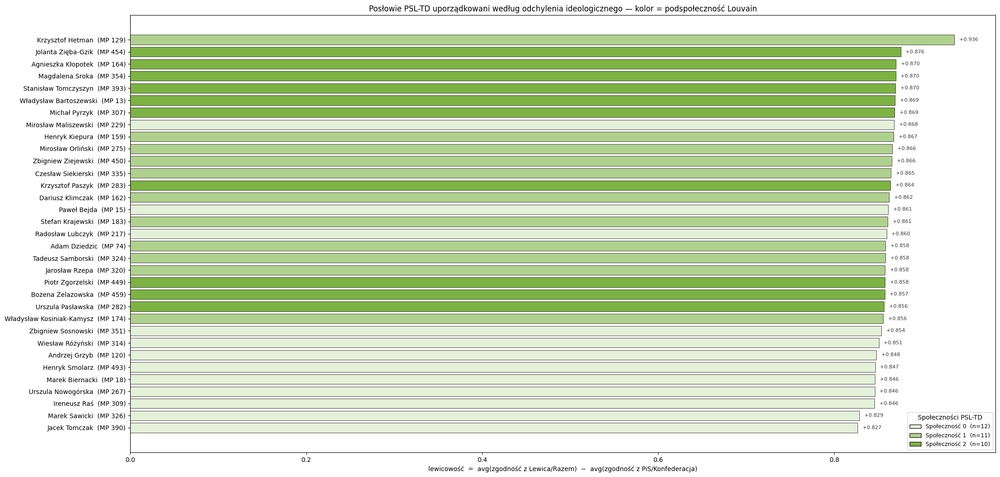

In [99]:
_, psl_comms, psl_palette = _community_colors("PSL-TD")
psl_sub_to_color = {cid: psl_palette[cid] for cid in range(len(psl_comms))}
bar_colors = [psl_sub_to_color[s] for s in df_psl["sub_community"]]

fig, ax = plt.subplots(figsize=(22, max(5, 0.32 * len(df_psl))))
y = np.arange(len(df_psl))
ax.barh(y, df_psl["leftness"], color=bar_colors, edgecolor="#222", linewidth=0.6)
for i, row in df_psl.iterrows():
    ax.text(row["leftness"] + (0.002 if row["leftness"] >= 0 else -0.002),
            i, f"  {row['leftness']:+.3f}",
            va="center",
            ha="left" if row["leftness"] >= 0 else "right",
            fontsize=8, color="#333")

ax.set_yticks(y)
ax.set_yticklabels([f"{r['name']}  (MP {r['MP']})" for _, r in df_psl.iterrows()])
ax.invert_yaxis()
ax.axvline(0, color="black", lw=0.8)
ax.set_xlabel("lewicowość  =  avg(zgodność z Lewica/Razem)  −  avg(zgodność z PiS/Konfederacja)")
ax.set_title("Posłowie PSL-TD uporządkowani według odchylenia ideologicznego — kolor = podspołeczność Louvain")

handles = [
    Patch(facecolor=col, edgecolor="#222",
          label=f"Społeczność {sub}  (n={len(psl_comms[sub])})")
    for sub, col in psl_sub_to_color.items()
]
ax.legend(handles=handles, loc="lower right", title="Społeczności PSL-TD", fontsize=9)
ax.autoscale_view()
plt.tight_layout()
plt.show()

In [79]:
# Numeric verdict: do the Louvain sub-communities differ on the leftness axis?
sub_stats = (
    df_psl.groupby("sub_community")["leftness"]
    .agg(["mean", "median", "min", "max", "count"])
    .round(4)
)
print("Leftness by PSL-TD sub-community:")
display(sub_stats)

if len(sub_stats) >= 2:
    gap = sub_stats["mean"].max() - sub_stats["mean"].min()
    leftmost = sub_stats["mean"].idxmax()
    rightmost = sub_stats["mean"].idxmin()
    print(
        f"\nMean-leftness gap between sub-communities: {gap:.3f}  "
        f"(sub-community {leftmost} is the most left-leaning, "
        f"sub-community {rightmost} the most right-leaning)."
    )
    if gap > 0.02:
        print("→ Louvain sub-communities do separate along the left/right axis.")
    else:
        print("→ Louvain sub-communities barely differ on the left/right axis "
              "— the split likely captures a different signal.")

Leftness by PSL-TD sub-community:


,mean,median,min,max,count
sub_community,,,,,
0,0.8484,0.8472,0.8267,0.8681,12
1,0.8684,0.8623,0.8555,0.9364,11
2,0.8658,0.8689,0.8565,0.8756,10



Mean-leftness gap between sub-communities: 0.020  (sub-community 1 is the most left-leaning, sub-community 0 the most right-leaning).
→ Louvain sub-communities barely differ on the left/right axis — the split likely captures a different signal.


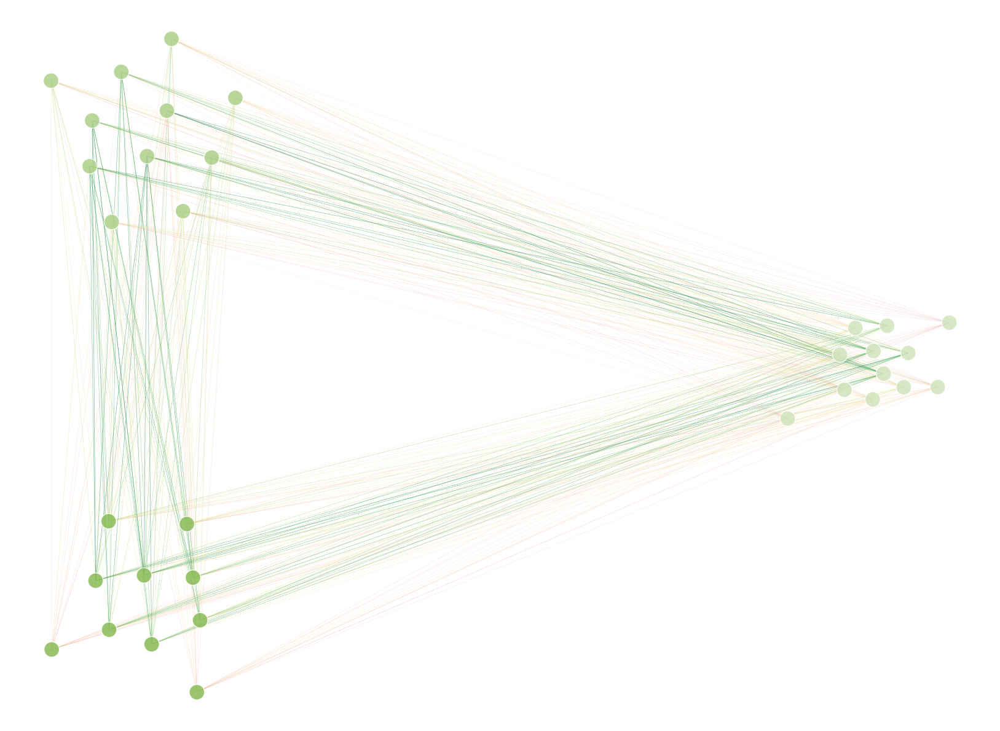

In [91]:
H = party_graphs["PSL-TD"]
color_of, comms, palette = _community_colors("PSL-TD")
pos = community_block_layout(H, comms)

fig, ax = plt.subplots(figsize=(26, 12))

# --- Krawędzie cross-community kolorowane weight_rescaled ---
mp_to_sub = {mp: cid for cid, comm in enumerate(comms) for mp in comm}

cross_edges_data = [
    ((pos[u], pos[v]), d["weight_rescaled"])
    for u, v, d in H.edges(data=True)
    if mp_to_sub[u] != mp_to_sub[v]
]

if cross_edges_data:
    segs = [s for s, _ in cross_edges_data]
    weights = np.array([w for _, w in cross_edges_data])

    cmap = plt.cm.RdYlGn
    colors = cmap(weights)
    colors[:, 3] = np.clip(weights * 0.6 + 0.05, 0.05, 0.65)

    ax.add_collection(LineCollection(segs, colors=colors, linewidths=0.4, zorder=1))

# --- Węzły ---
nodes = nx.draw_networkx_nodes(
    H, pos, ax=ax,
    node_size=320,
    node_color=[color_of[n] for n in H.nodes()],
    edgecolors="white", linewidths=1.0, alpha=0.85,
)
nodes.set_zorder(2)
ax.autoscale_view()
ax.set_aspect("equal")
ax.axis("off")
plt.tight_layout()
plt.show()